# Transformation of the data


## Retrieving categories based on text :

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
import pickle

In [ ]:
import pickle
folder_name = 'data/'
df_objectives = pickle.load(open(folder_name+'df_objectives.p','rb'))
df_offers = pickle.load(open(folder_name+'df_offers.p','rb'))
df_members = pickle.load(open(folder_name+'df_members.p','rb'))
df_information = pickle.load(open(folder_name+'df_information.p','rb'))
df_functions = pickle.load(open(folder_name+'df_functions.p','rb'))
df_activities = pickle.load(open(folder_name+'df_activities.p','rb'))
df_objectives.dropna( subset=['objectives'],inplace=True)


## Etude du dataset objectif : 

In [ ]:
print(df_objectives.head())

from bertopic import BERTopic

# Créer un modèle BERTopic
topic_model = BERTopic()

# Extraire les topics
topics, probs = topic_model.fit_transform(list(map(str, df_objectives['objectives'].tolist())) )

# Ajouter les catégories au dataframe
df_objectives['topic_with_stop_words'] = topics

# Voir les principaux thèmes
print(topic_model.get_topic_info())

   index  id                                         objectives  topic  \
0      0   0  Développer la culture dans le secteur rural en...      2   
1      0   0                          Réalisation d’un festival      3   
2      0   0  Organiser d’autres événements dans des lieux i...      0   
4      2   2                         Organisation de spectacles      9   
5      2   2                            Promotion de spectacles      9   

   topic_avec_représenation  topic_wo_stop_words  
0                         2                    2  
1                         3                    3  
2                         0                    1  
4                         9                   15  
5                         9                   15  
    Topic  Count                                       Name  \
0      -1    138                            -1_de_la_le_des   
1       0    113                 0_musique_la_de_promouvoir   
2       1     59                         1_les_de_plus_pour 

Conclusion :  pas bon.

### Categories without stopwords

In [61]:
len(df_objectives)

601

In [95]:
import nltk
from nltk.corpus import stopwords

# Télécharger la liste de stop words en français
nltk.download('stopwords')
stop_words = set(stopwords.words('french'))  # Liste des stopwords en français

# Exemple de texte
textes = list(map(str, df_objectives['objectives'].tolist())) 

# Supprimer les stopwords
list_mots_filtres = [[mot for mot in texte.split() if mot.lower() not in stop_words] for texte in textes ]
resultats = [" ".join(mots_filtres).lower() for mots_filtres in list_mots_filtres ]

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\axelp\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [96]:
from bertopic import BERTopic

# Créer un modèle BERTopic
topic_model = BERTopic()

# Extraire les topics
topics, probs = topic_model.fit_transform(resultats )

# Ajouter les catégories au dataframe
df_objectives['topic_1'] = topics
df_objectives = df_objectives.merge(topic_model.get_topic_info().rename(columns={'Name':'label_1','Representation': 'representation_1'}),
                                                 right_on = 'Topic',
                                                 left_on = 'topic_1', how = 'left')

# Voir les principaux thèmes
print(topic_model.get_topic_info())


    Topic  Count                                       Name  \
0      -1    170                -1_none_temps_music_culture   
1       0     99                  0_plus_amiens_afin_mettre   
2       1     93    1_musique_promouvoir_musiques_actuelles   
3       2     52       2_actions_sociale_associations_aides   
4       3     36          3_concerts_festival_festivals_and   
5       4     32  4_artistes_soutenir_diffusion_accompagner   
6       5     19       5_vnements_dvnements_toutes_facettes   
7       6     15          6_enfance_petite_jeunesse_atelier   
8       7     14                           7_62_03_20_ville   
9       8     14             8_arcades_centre_musical_salle   
10      9     12    9_musicaux_organiser_vnements_dvnements   
11     10     12      10_spectateurs_mise_relation_proposer   
12     11     11      11_spectacles_public_large_exposition   
13     12     11            12_vendredi_9h12h_lundi_8h3012h   
14     13     11   13_stockage_technique_laccs_statisti

### fine tune topic representations :

https://maartengr.github.io/BERTopic/index.html#quick-start

In [97]:
from bertopic.representation import KeyBERTInspired

# Créer un modèle BERTopic
representation_model = KeyBERTInspired()

# Créer un modèle BERTopic
topic_model = BERTopic(representation_model=representation_model)
# Extraire les topics
topics, probs = topic_model.fit_transform(resultats )

# Ajouter les catégories au dataframe
df_objectives['topic_2'] = topics
df_objectives = df_objectives.merge(topic_model.get_topic_info().rename(columns={'Name':'label_2','Representation': 'representation_2'}),
                                                 right_on = 'Topic',
                                                 left_on = 'topic_2', how = 'left')
# df_objectives['']
# Voir les principaux thèmes
print(topic_model.get_topic_info())

    Topic  Count                                           Name  \
0      -1    137       -1_concerts_musicaux_music_hautsdefrance   
1       0    128              0_entre_interdire_logement_contre   
2       1     95          1_musique_musiques_musicaux_musicales   
3       2     48  2_aides_associations_participation_volunteers   
4       3     35              3_concerts_concert_festivals_tour   
5       4     33        4_soutenir_artistes_artistique_artistic   
6       5     27      5_musicaux_organiser_concerts_artistiques   
7       6     26           6_14h3018h30_8h3012h_13h3017h30_8h30   
8       7     14              7_arcades_centre_musical_musicale   
9       8     12      8_spectacles_public_exposition_production   
10      9     12            9_stockage_stockes_utilises_stocker   
11     10     12        10_service_proposer_demande_spectateurs   
12     11     11     11_enfance_enfants_enfantsparents_jeunesse   
13     12     11             12_espaces_espace_lespace_despace

In [98]:
df_objectives#.drop('topic_representation',inplace=True)

,index,id,objectives,topic_1,Topic_x,Count_x,label_1,representation_1,Representative_Docs_x,topic_2,Topic_y,Count_y,label_2,representation_2,Representative_Docs_y
0,0,0,Développer la culture dans le secteur rural en...,2,2,52,2_actions_sociale_associations_aides,"[actions, sociale, associations, aides, cultur...","[aides associations, proposer actions médiatio...",2,2,48,2_aides_associations_participation_volunteers,"[aides, associations, participation, volunteer...","[aides associations, aides associations, missi..."
1,0,0,Réalisation d’un festival,3,3,36,3_concerts_festival_festivals_and,"[concerts, festival, festivals, and, organiser...","[organisation concerts, organisation soirées c...",3,3,35,3_concerts_concert_festivals_tour,"[concerts, concert, festivals, tour, festival,...","[concerts, organisation soirées concerts, orga..."
2,0,0,Organiser d’autres événements dans des lieux i...,0,0,99,0_plus_amiens_afin_mettre,"[plus, amiens, afin, mettre, grer, chaque, fai...","[depuis maintenant plus 25 ans, art point a l’...",0,0,128,0_entre_interdire_logement_contre,"[entre, interdire, logement, contre, avoir, pe...","[depuis maintenant plus 25 ans, art point a l’..."
3,2,2,Organisation de spectacles,11,11,11,11_spectacles_public_large_exposition,"[spectacles, public, large, exposition, attire...","[proposer spectacles jeune public, spectacles ...",8,8,12,8_spectacles_public_exposition_production,"[spectacles, public, exposition, production, o...","[proposer spectacles jeune public, spectacles ..."
4,2,2,Promotion de spectacles,11,11,11,11_spectacles_public_large_exposition,"[spectacles, public, large, exposition, attire...","[proposer spectacles jeune public, spectacles ...",8,8,12,8_spectacles_public_exposition_production,"[spectacles, public, exposition, production, o...","[proposer spectacles jeune public, spectacles ..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
596,168,168,"Une mission : LE REPÉRAGE, L'ACCOMPAGNEMENT ET...",-1,-1,170,-1_none_temps_music_culture,"[none, temps, music, culture, studio, marchs, ...",[dynamo produit diffuse également 2 concerts j...,-1,-1,137,-1_concerts_musicaux_music_hautsdefrance,"[concerts, musicaux, music, hautsdefrance, art...",[expand the visibility of the music scene in h...
597,168,168,L'ORGANISATION D’ÉVÉNEMENTS CULTURELS Avec des...,-1,-1,170,-1_none_temps_music_culture,"[none, temps, music, culture, studio, marchs, ...",[dynamo produit diffuse également 2 concerts j...,5,5,27,5_musicaux_organiser_concerts_artistiques,"[musicaux, organiser, concerts, artistiques, m...","[organiser événements musicaux, organiser évén..."
598,168,168,LES ACTIONS CULTURELLES Avec les publics éloig...,2,2,52,2_actions_sociale_associations_aides,"[actions, sociale, associations, aides, cultur...","[aides associations, proposer actions médiatio...",2,2,48,2_aides_associations_participation_volunteers,"[aides, associations, participation, volunteer...","[aides associations, aides associations, missi..."
599,168,168,LA VENTE DE SPECTACLES Avec des concerts de mu...,1,1,93,1_musique_promouvoir_musiques_actuelles,"[musique, promouvoir, musiques, actuelles, mus...","[promouvoir musique artistes, promouvoir musiq...",1,1,95,1_musique_musiques_musicaux_musicales,"[musique, musiques, musicaux, musicales, music...","[promouvoir musique artistes, promouvoir musiq..."


### Etude des 3 topics:

In [99]:
df_objectives

,index,id,objectives,topic_1,Topic_x,Count_x,label_1,representation_1,Representative_Docs_x,topic_2,Topic_y,Count_y,label_2,representation_2,Representative_Docs_y
0,0,0,Développer la culture dans le secteur rural en...,2,2,52,2_actions_sociale_associations_aides,"[actions, sociale, associations, aides, cultur...","[aides associations, proposer actions médiatio...",2,2,48,2_aides_associations_participation_volunteers,"[aides, associations, participation, volunteer...","[aides associations, aides associations, missi..."
1,0,0,Réalisation d’un festival,3,3,36,3_concerts_festival_festivals_and,"[concerts, festival, festivals, and, organiser...","[organisation concerts, organisation soirées c...",3,3,35,3_concerts_concert_festivals_tour,"[concerts, concert, festivals, tour, festival,...","[concerts, organisation soirées concerts, orga..."
2,0,0,Organiser d’autres événements dans des lieux i...,0,0,99,0_plus_amiens_afin_mettre,"[plus, amiens, afin, mettre, grer, chaque, fai...","[depuis maintenant plus 25 ans, art point a l’...",0,0,128,0_entre_interdire_logement_contre,"[entre, interdire, logement, contre, avoir, pe...","[depuis maintenant plus 25 ans, art point a l’..."
3,2,2,Organisation de spectacles,11,11,11,11_spectacles_public_large_exposition,"[spectacles, public, large, exposition, attire...","[proposer spectacles jeune public, spectacles ...",8,8,12,8_spectacles_public_exposition_production,"[spectacles, public, exposition, production, o...","[proposer spectacles jeune public, spectacles ..."
4,2,2,Promotion de spectacles,11,11,11,11_spectacles_public_large_exposition,"[spectacles, public, large, exposition, attire...","[proposer spectacles jeune public, spectacles ...",8,8,12,8_spectacles_public_exposition_production,"[spectacles, public, exposition, production, o...","[proposer spectacles jeune public, spectacles ..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
596,168,168,"Une mission : LE REPÉRAGE, L'ACCOMPAGNEMENT ET...",-1,-1,170,-1_none_temps_music_culture,"[none, temps, music, culture, studio, marchs, ...",[dynamo produit diffuse également 2 concerts j...,-1,-1,137,-1_concerts_musicaux_music_hautsdefrance,"[concerts, musicaux, music, hautsdefrance, art...",[expand the visibility of the music scene in h...
597,168,168,L'ORGANISATION D’ÉVÉNEMENTS CULTURELS Avec des...,-1,-1,170,-1_none_temps_music_culture,"[none, temps, music, culture, studio, marchs, ...",[dynamo produit diffuse également 2 concerts j...,5,5,27,5_musicaux_organiser_concerts_artistiques,"[musicaux, organiser, concerts, artistiques, m...","[organiser événements musicaux, organiser évén..."
598,168,168,LES ACTIONS CULTURELLES Avec les publics éloig...,2,2,52,2_actions_sociale_associations_aides,"[actions, sociale, associations, aides, cultur...","[aides associations, proposer actions médiatio...",2,2,48,2_aides_associations_participation_volunteers,"[aides, associations, participation, volunteer...","[aides associations, aides associations, missi..."
599,168,168,LA VENTE DE SPECTACLES Avec des concerts de mu...,1,1,93,1_musique_promouvoir_musiques_actuelles,"[musique, promouvoir, musiques, actuelles, mus...","[promouvoir musique artistes, promouvoir musiq...",1,1,95,1_musique_musiques_musicaux_musicales,"[musique, musiques, musicaux, musicales, music...","[promouvoir musique artistes, promouvoir musiq..."


### Word cloud :

AttributeError: 'WordListCorpusReader' object has no attribute 'list'

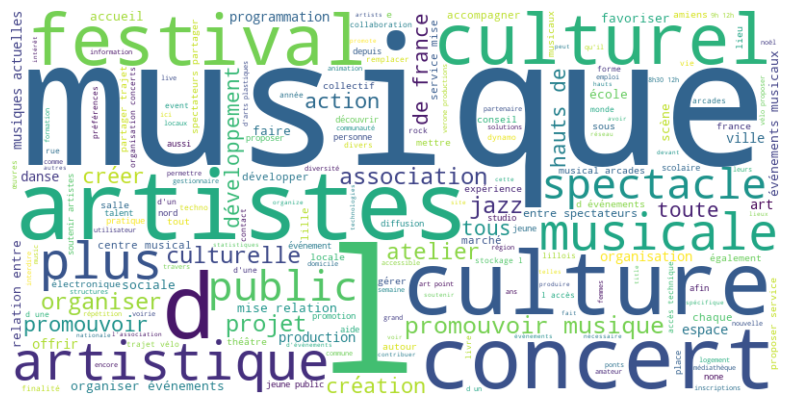

In [112]:
import matplotlib.pyplot as plt
from wordcloud import WordCloud
import pandas as pd
import re

# Nettoyage du texte
def clean_text(text):
    text = text.lower()  # Convertir en minuscules
    text = re.sub(r'\W+', ' ', text)  # Supprimer la ponctuation
    text = re.sub(r'\d+', '', text)  # Supprimer les chiffres
    text
    return text.strip()

# Convertir en chaîne unique
# text_data = " ".join(df_objectives['objectives'].dropna().astype(str).apply(clean_text))
text_data = " ".join(resultats)
# # Télécharger la liste de stop words en français
# nltk.download('stopwords')
# stop_words = set(stopwords.words('french'))  # Liste des stopwords en français


# # Supprimer les stopwords
# list_mots_filtres = [[mot for mot in texte.split() if mot.lower() not in stop_words] for texte in textes ]

# Créer le Word Cloud
wordcloud = WordCloud(width=800, height=400, background_color='white', colormap='viridis').generate(text_data)

# Afficher le Word Cloud
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")  # Cacher les axes
plt.show()


Développer culture secteur rural proposant évènements inédits lieux insolites Engage with the community animations scolaires défendre collectivement projet culturel s'investir activement vie l'association travers actions soutenir financièrement actions l'association Gérer lieu d'expérimentation culturelle sociale sein commune Fréniches : Tiers-Lieu Commune Développer actions sensibilisation auprès différents publics Expérience collective fédératrice Préserver traditions écossaises Animation, associations Comité d'animation Subventions associations Aides associations Annuaire associations Activités culturelles Actions sportives Action sociale Aides sociales Centre Communal d'Action Sociale Aides communales Aides sociales légales Épicerie sociale Insertion, RSA Subventions associations Aides associations Action sociale scène ouverte toutes cultures Animation, associations Favoriser l'inclusion l'accessibilité Développer projets culturels Mener actions culturelles Proposer programmation j

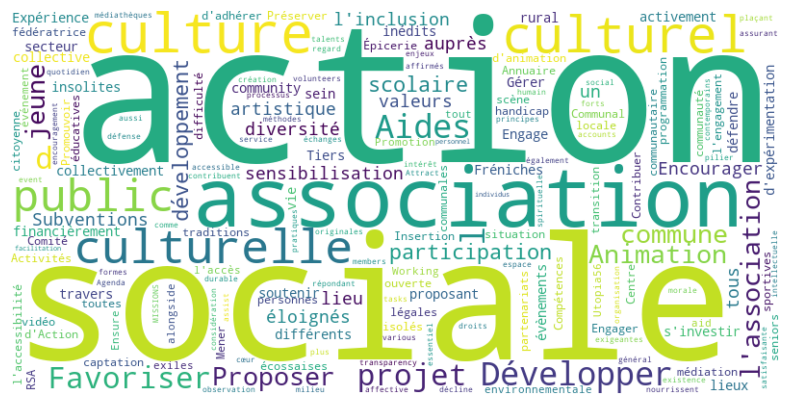

Réalisation d’un festival Organize concerts and events Organisation concerts Organisation soirées concerts Festival INOUÏES Concerts Organisation concerts Punk, Oi, Ska, Hardcore, PV, Grind... sans profit antifasciste. Diversifier rôle autour concert, salle, festival, développement d’artistes Produire propre festival : Paradis Artificiels Organisation concerts psych/stoner/doom/sludge/space-rock Hauts-de-France. Orgas concerts Nord France (62/59) Ateliers, conversations, concerts performances Organisation concerts festivals metal Organise shows since 2001 Festival Tour Chauffe House & Techno Events organisation concerts lille Collaboration divers festivals institutions Organiser concerts scènes ouvertes Organiser spectacles concerts Organiser festivals conférences musicales Organiser premier Festival : Dunkerque « SPIRIT of JAZZ » Organiser conférences musicales Manufacture d’expériences — production, direction artistique, programmation, scénographie, concerts, festivals, conseils Org

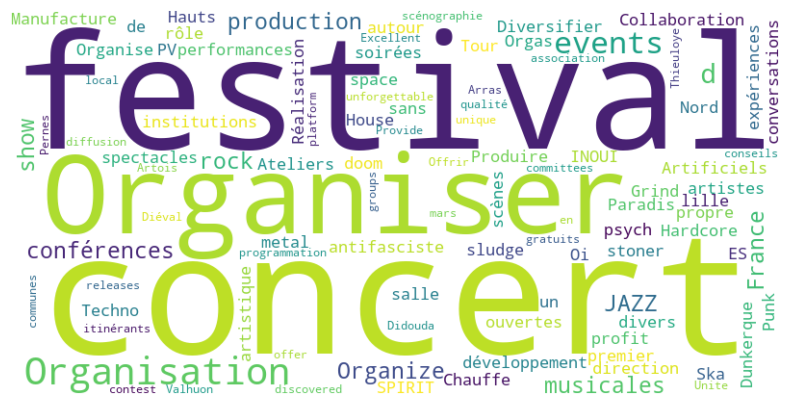

Organiser d’autres événements lieux insolites, afin mettre avant cette richesse locale artistes fait trembler Jardin d'Hiver 2025 fait consentir retirer consentement peut avoir effet négatif certaines caractéristiques fonctions. Gérer options Gérer services Gérer {vendor_count} fournisseurs Gérer consentement Faire rayonner l’art, socialement durablement. Offrir atmosphère chaleureuse propice l'expression artistique Visites Chaque semaine durant COVID19 confinement everyweek during the COVID19 lockdown Mettre devant scène jeunes artistes accompagner plus confirmés développement Hauts-de-France Tisser liens forts Smac, associations, mairies organisateurs privés nord France Gérer renforcer grands évènements culturels sportifs Art Point réinvestit espaces industriels abandonnés lieux phares l’histoire roubaisienne, créant ainsi première Braderie l’Art coeur anciens bains municipaux Roubaix – aujourd’hui célèbres sous nom Piscine. Depuis maintenant plus 25 ans, Art Point a l’occasion colla

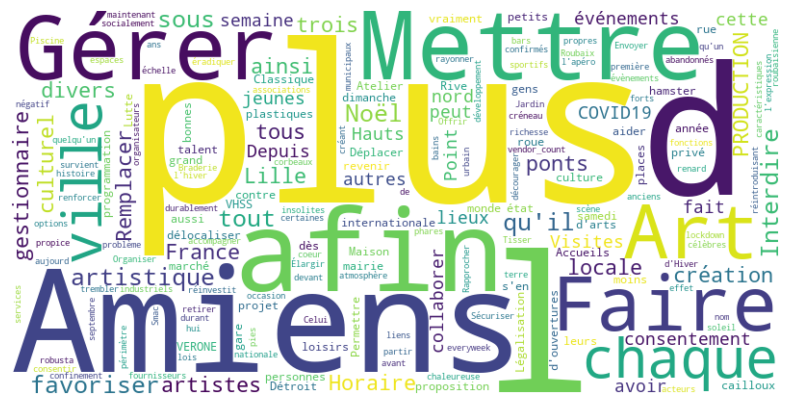

Organisation spectacles Promotion spectacles Production spectacles spectacles tout public Spectacles Exposition Fédérer large public Offrir spectacles rue Proposer spectacles jeune public Attirer public large varié Produire spectacles créations audiovisuelles
topic :  ['11_spectacles_public_large_exposition']


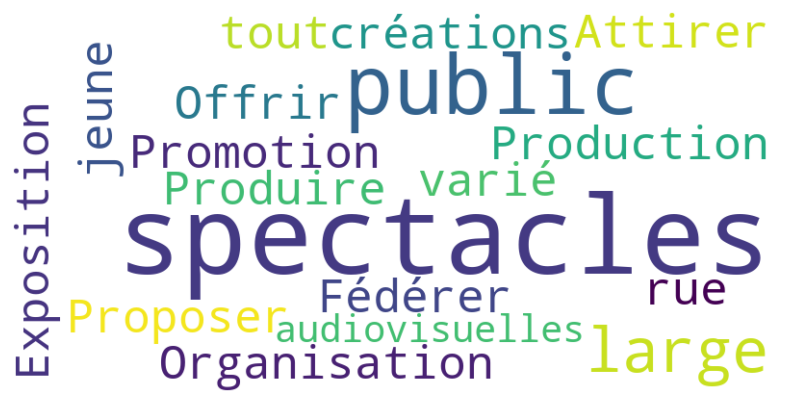

Promote musical artists None Global groove 24/7 récap semaine studio début d’année 2025 studio L'expérience electro Hauts France depuis 10 ans ! Engagements Partenaires Espace Pro Politique cookies (UE) S'inscrire Newsletter Fonctionnel Toujours activé Préférences Marketing savoir plus finalités Accepter Refuser Voir préférences Enregistrer préférences Voir préférences {title} {title} {title} Promouvoir l'accès culture campagnes Contribuer densifier tissu social solidarités l’échelle locale 5 engagements Editions précédentes Rencontres promouvoir gastronomie livre stream facebook Gérer toute l’année concerts salles métropole lilloise région Créer, écouter explorer événement mêlant design récupération, do it yourself, technologies issues FaBlab, prônant création travers circuits courts, d’économie circulaire – attirant chaque année entre 15 20 000 personnes. Réouvrir frontières déchetteries municipales Légaliser meurtres sexuels dauphins Remplacer signal d'avertissement bus chanson "à q

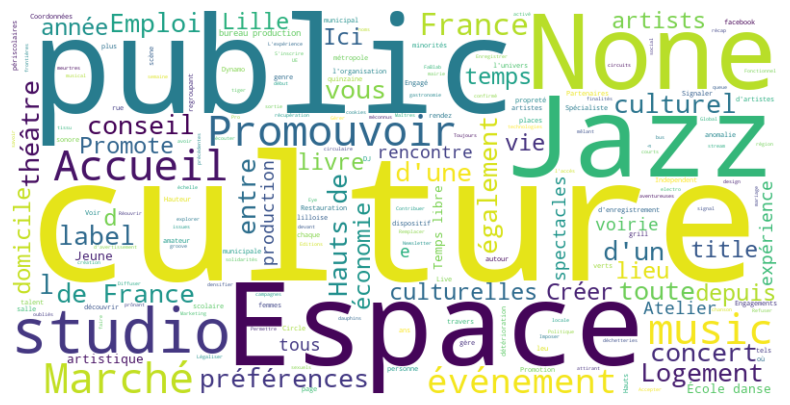

Promotion musique stoner/doom/sludge/post/djent/modern/synthwave Promouvoir musique électronique expérimentale Nouvelle Sounds Good promouvoir musique sous toutes formes milieu rural, prix accessibles tous faire connaître musiciens renommée nationale Promouvoir musique artistes Créer communauté autour musique Promotion musique électronique Collectif musique électronique Lillois Être partenaire aventure musicale Contribuer réalisation projets musicaux plus audacieux promouvoir musique monde tous styles Offrir meilleur musique live Créer réaliser œuvres musicales nouvelles Diffuser œuvres musicales Développer recherche musicale Transmettre œuvres électroacoustiques Pratiquer nouveaux instruments Découvrir nouvelles formes musique portée l’ambition défendre ouverture d’esprit, tolérance diversité culturelle autour musique électronique, Art Point initie N.A.M.E Festival 2005. Art Point conçoit produits diffuse installations urbaines entre arts visuels, musique arts vivants. Remplacer panie

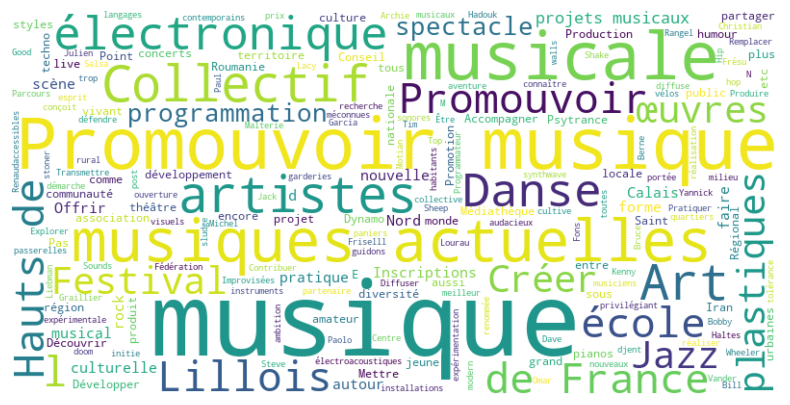

Soutenir artistes locaux Favoriser collaboration entre artistes présenter artistes région Talk : parcours Artistes, Manager Agents. Collaboration d'autres associations artistes Adhesion Concours composition projets créations diffusion Accompagner artistes développement carrière Accompagner artistes soutenir développement talents Mobilisation festive, artistique engagée lieu mis disposition groupes locaux offre également conditions répétition création équipes artistiques résidence. Mireille Delville Coryne Marliez – entretien accueil artistes Soutenir artistes émergents confirmés Donner visibilité artistes femmes Accompagner artistes résidences Collaboration artistes agences production Disposition matériel diffusion Accompagner artistes développement carrière Aider artistes Collaborer structures belges Soutenir artistes locaux Favoriser échanges interculturels mobilité artistes Soutenir création artistique diffusion œuvres Soutenir artistes développement Mixing political engagement, vis

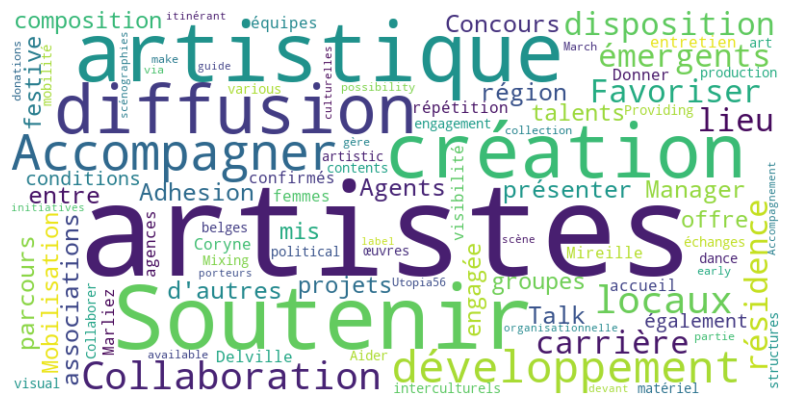

Organiser événements musicaux Organiser événements musicaux Création d'évènements Bass music Organiser contes musicaux Organiser événements musicaux Organiser concerts événements musicaux Organisations d'évènements musicaux éphémères marquants, alentours métropole lilloise. Organiser concerts événements musicaux Organisation d’événements musicaux Organiser événements musicaux Organiser concerts événements musicaux Organiser événements musicaux artistiques
topic :  ['9_musicaux_organiser_vnements_dvnements']


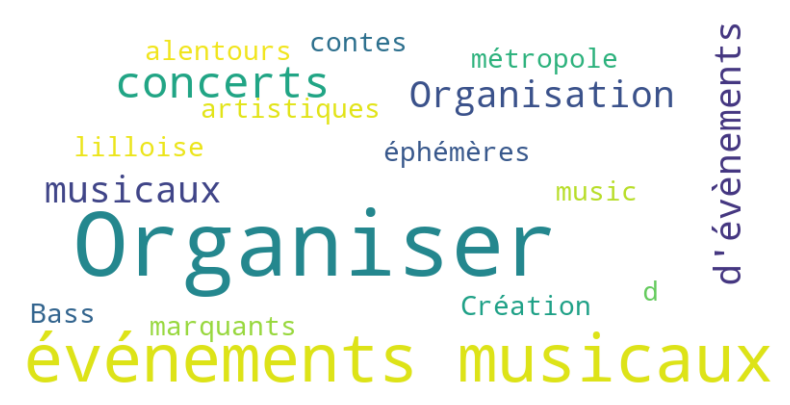

MINICLUB Comala : Restitution Ateliers Mix + sons semaine Ateliers Atelier enfants Atelier ados Atelier ados / adultes Enfance, jeunesse Petite enfance Service Petite enfance Relais Petite Enfance (Îlot Nounous) L'accueil enfants-parents (îlot piccolo) Enfance Jeunesse interlocuteurs Enfance, jeunesse Tasseurs sol
topic :  ['6_enfance_petite_jeunesse_atelier']


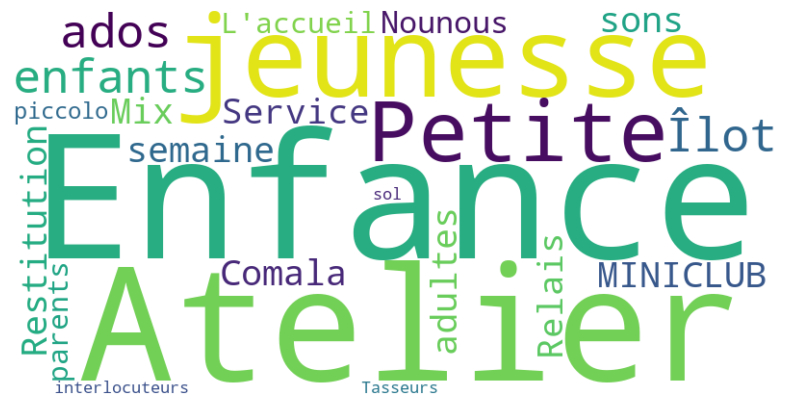

ATELIER MIX Margaux 59000 Mardi, jeudi vendredi 14h30-18h30 Mercredi 9h-12h 14h30-18h30 lundi vendredi 8h30-12h 13h30-17h30 Samedi 9h-12h lundi jeudi 8h30-12h 13h30-17h30 Vendredi 8h30-12h Samedi 9h-12h lundi vendredi 8h30 12h Samedi 9h-12h Concentré 3 jours
topic :  ['12_vendredi_9h12h_lundi_8h3012h']


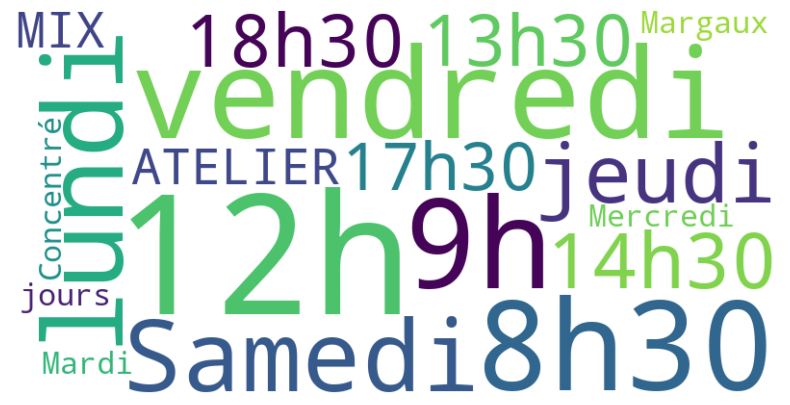

Contact Télé Assistance ville recrute ville recrute Ventes mobilières ville Contacts : studioka.net / contact@studioka.net / 03 20 62 96 95 59155 Faches-Thumesnil 03 20 62 96 96 arcades@ville-fachesthumesnil.fr Hôtel ville 59155 Faches-Thumesnil Tél: 03 20 62 61 61 / Fax :03 20 62 61 62 Mail: service.courrier@ville-fachesthumesnil.fr Mail : contact@ville-fachesthumesnil.fr
topic :  ['7_62_03_20_ville']


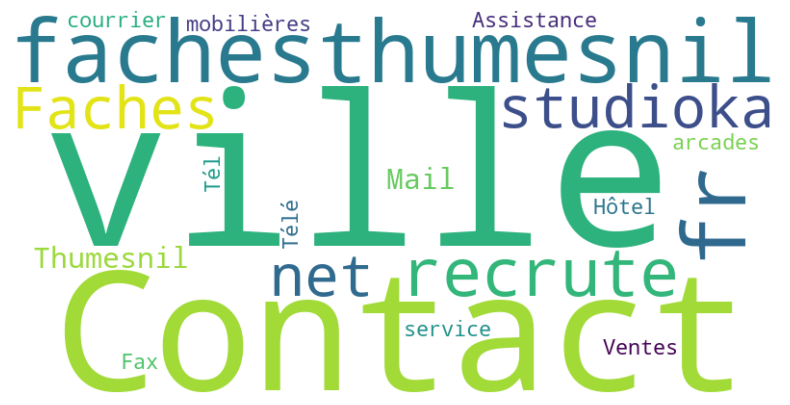

offrir meilleures expériences, utilisons technologies telles cookies stocker et/ou accéder informations appareils. fait consentir technologies permettra traiter données telles comportement navigation ID uniques site. stockage l’accès technique strictement nécessaire finalité d’intérêt légitime permettre l’utilisation d’un service spécifique explicitement demandé l’abonné l’utilisateur, seul but d’effectuer transmission d’une communication réseau communications électroniques. stockage l’accès technique nécessaire finalité d’intérêt légitime stocker préférences demandées l’abonné l’utilisateur. Statistiques stockage l’accès technique utilisé exclusivement fins statistiques. stockage l’accès technique utilisé exclusivement finalités statistiques anonymes. l’absence d’une assignation comparaître, d’une conformité volontaire part fournisseur d’accès internet d’enregistrements supplémentaires provenant d’une tierce partie, informations stockées extraites cette seule fin peuvent généralement 

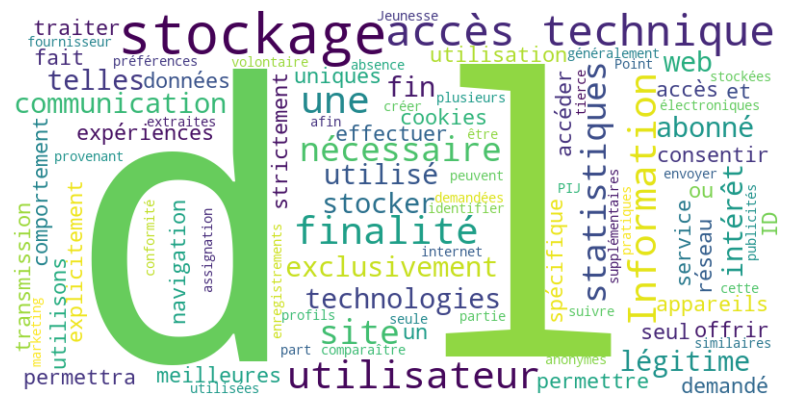

d'être informé régulièrement événements organisés Traces & Cie Maîtriser toutes facettes l’organisation production d’événements Travailler nombreux partenaires toutes facettes leurs évènements privés Créer événements créer événements festifs, accessibles profitables toutes tous Organiser événements professionnels Organisation but non lucratif Organiser événements culturels Organisation d’événements Trap / Techno Service événementiel Formation professionnelle Offrir événements qualité Expérience l'événementiel culturel Créer événements mesure Organiser événements culturels 20 ans l’événement l’an prochain Organisation d’événements culturels Organiser événements underground techno communauté LGBTQIA+ amis Production d'événements
topic :  ['5_vnements_dvnements_toutes_facettes']


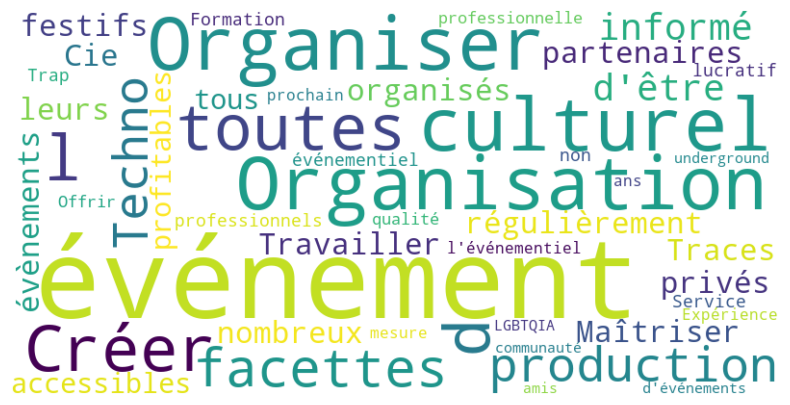

Proposer solutions adaptées besoins spécifiques organisateurs d’événements professionnels Contacter toute demande devis Proposer solutions concrètes innovantes inciter spectateurs devenir acteurs d’une mobilité plus responsable Proposer solutions mise relation entre spectateurs favoriser covoiturage copiétonnage Proposer offres solutions mobilité service mise relation entre spectateurs favoriser covoiturage copiétonnage Proposer service mise relation entre spectateurs partager trajet voiture Proposer service mise relation entre spectateurs partager trajet pieds Proposer service mise relation entre spectateurs partager trajet vélo Proposer service mise relation entre spectateurs partager trajet vélo Proposer service mise relation entre spectateurs partager trajet vélo Proposer service mise relation entre spectateurs partager trajet vélo Proposer service mise relation entre spectateurs partager trajet vélo
topic :  ['10_spectateurs_mise_relation_proposer']


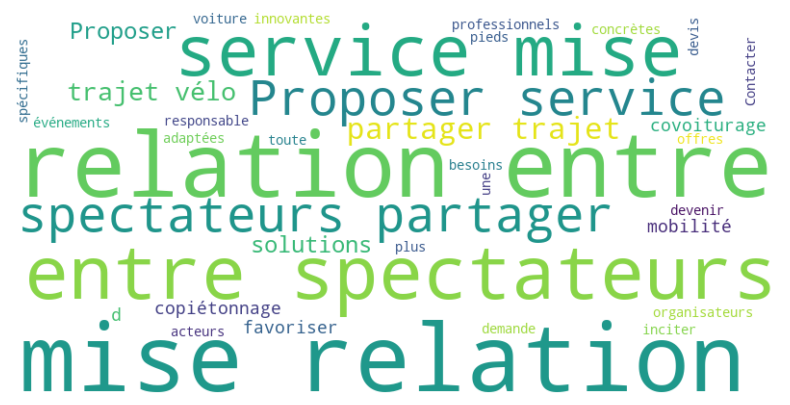

Découvrir Arcades Centre Musical Arcades Découvrir Arcades Centre Musical Arcades propose programmation diversifiée grande qualité, largement ouverte musiques monde, jazz, jeune public l'accompagnement d'artistes régionaux. salle spectacle Arcades possède capacité d'accueil 169 places assises. Studio KA installé l’enceinte Centre Musical Arcades. configuration, d’offrir large éventail prises sons : salle répétition Centre musical Arcades dispose également d'une salle répétition 80m2 entièrement équipée (sonorisation parc instrumental). passés Arcades Centre Musical Arcades Centre Musical Arcades accessible personnes situation handicap Centre Musical Arcades Formations Accompagnement studio Intramurock Haute Fréquence Émission radio musicale focalisée culture club crate-digging
topic :  ['8_arcades_centre_musical_salle']


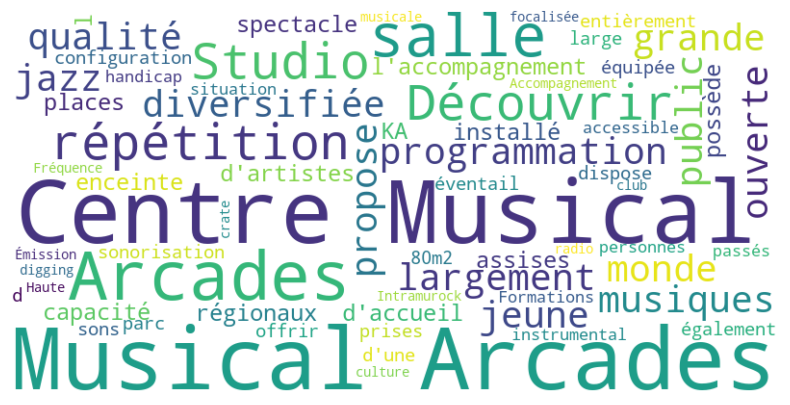

In [113]:
## make a world cloud for each topic
# Créer le Word Cloud

topics = df_objectives['topic_1'].unique()
for topic in topics:
    text_data = " ".join(df_objectives[df_objectives['topic_1']==topic]['objectives'])
    text_data = " ".join([mots for mots in text_data.split() if mots.lower() not in stop_words])
    print(text_data)
    wordcloud = WordCloud(width=800, height=400, background_color='white', colormap='viridis').generate(text_data)
    print('topic : ', df_objectives[df_objectives['topic_1']==topic]['label_1'].unique() )
    # Afficher le Word Cloud
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis("off")  # Cacher les axes
    plt.show()

Développer culture secteur rural proposant évènements inédits lieux insolites Engage with the community animations scolaires défendre collectivement projet culturel s'investir activement vie l'association travers actions Gérer lieu d'expérimentation culturelle sociale sein commune Fréniches : Tiers-Lieu Commune Développer actions sensibilisation auprès différents publics Expérience collective fédératrice Préserver traditions écossaises Animation, associations Subventions associations Aides associations Annuaire associations Activités culturelles Actions sportives Action sociale Aides sociales Centre Communal d'Action Sociale Aides communales Aides sociales légales Épicerie sociale Insertion, RSA Subventions associations Aides associations Action sociale scène ouverte toutes cultures Animation, associations Favoriser l'inclusion l'accessibilité Développer projets culturels Mener actions culturelles Compétences captation vidéo Proposer actions médiation culturelle auprès publics éloignés

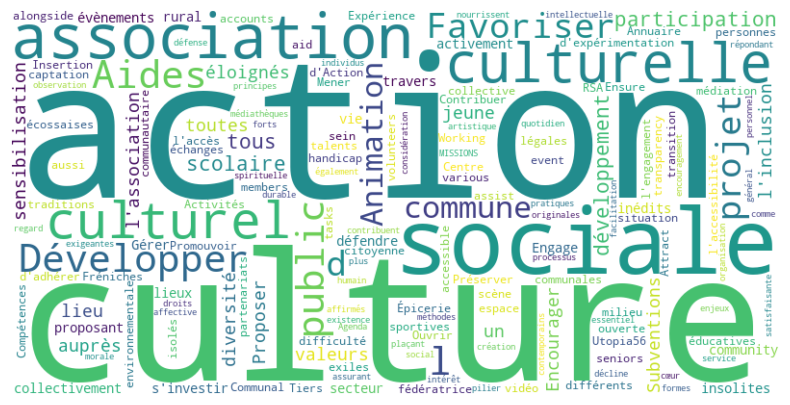

Réalisation d’un festival Organize concerts and events Organisation concerts Organisation soirées concerts Festival INOUÏES Concerts Organisation concerts Punk, Oi, Ska, Hardcore, PV, Grind... sans profit antifasciste. Diversifier rôle autour concert, salle, festival, développement d’artistes Produire propre festival : Paradis Artificiels Organisation concerts psych/stoner/doom/sludge/space-rock Hauts-de-France. Orgas concerts Nord France (62/59) Ateliers, conversations, concerts performances Organisation concerts festivals metal Organise shows since 2001 Festival Tour Chauffe House & Techno Events organisation concerts lille Collaboration divers festivals institutions Organiser concerts scènes ouvertes Organiser spectacles concerts Organiser festivals conférences musicales Organiser premier Festival : Dunkerque « SPIRIT of JAZZ » Organiser conférences musicales Organize events and releases Organiser festivals Organiser festival Jazz mars Offrir concerts qualité Organiser festivals it

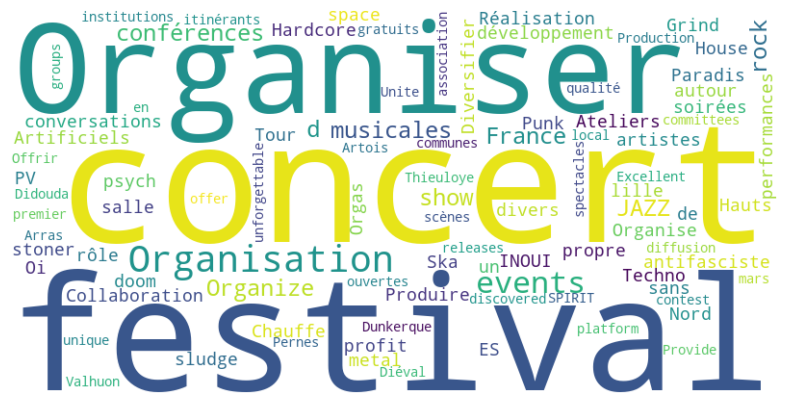

Organiser d’autres événements lieux insolites, afin mettre avant cette richesse locale artistes fait trembler Jardin d'Hiver 2025 S'inscrire Newsletter fait consentir retirer consentement peut avoir effet négatif certaines caractéristiques fonctions. Gérer options Gérer services Gérer {vendor_count} fournisseurs Gérer consentement Faire rayonner l’art, socialement durablement. Offrir atmosphère chaleureuse propice l'expression artistique Visites Chaque semaine durant COVID19 confinement Mettre devant scène jeunes artistes accompagner plus confirmés développement Hauts-de-France Tisser liens forts Smac, associations, mairies organisateurs privés nord France Gérer renforcer grands évènements culturels sportifs Art Point réinvestit espaces industriels abandonnés lieux phares l’histoire roubaisienne, créant ainsi première Braderie l’Art coeur anciens bains municipaux Roubaix – aujourd’hui célèbres sous nom Piscine. événement mêlant design récupération, do it yourself, technologies issues F

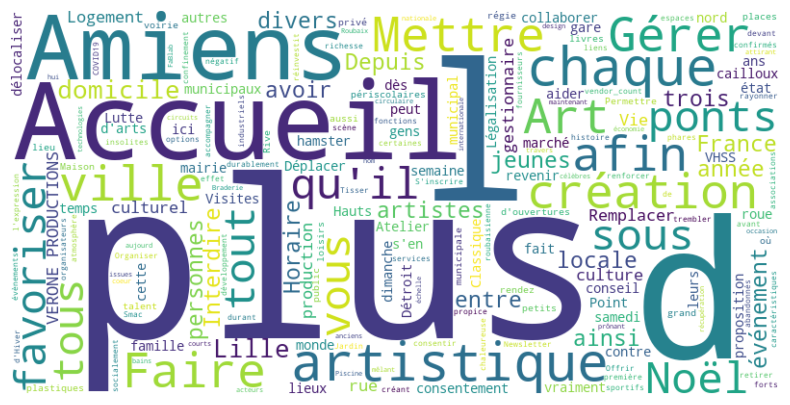

Organisation spectacles Promotion spectacles Production spectacles spectacles tout public Spectacles Exposition BAFA Fédérer large public Offrir spectacles rue Proposer spectacles jeune public Attirer public large varié Produire spectacles créations audiovisuelles
topic :  ['11_spectacles_public_large_exposition' '-1_none_temps_music_culture']


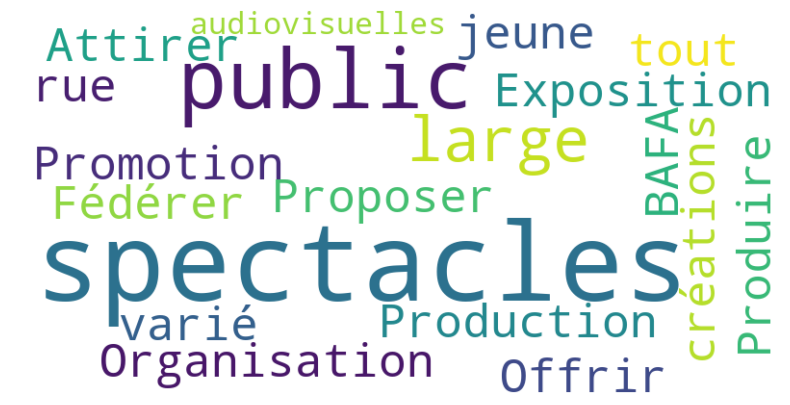

Promote musical artists None Global groove 24/7 récap semaine studio début d’année 2025 studio L'expérience electro Hauts France depuis 10 ans ! Engagements Partenaires Toujours activé Préférences Marketing savoir plus finalités Accepter Refuser Voir préférences Enregistrer préférences Voir préférences {title} {title} {title} soutenir financièrement actions l'association Promouvoir l'accès culture campagnes Contribuer densifier tissu social solidarités l’échelle locale 5 engagements Editions précédentes Rencontres promouvoir gastronomie everyweek during the COVID19 lockdown livre stream facebook Gérer toute l’année concerts salles métropole lilloise région Créer, écouter explorer Interdire robusta bars Légaliser meurtres sexuels dauphins Plus + moins - Diffuser "Eye of the tiger" chaque sortie mariage devant mairie créer événements festifs, accessibles profitables toutes tous faire découvrir public noms méconnus oubliés Créer expériences sonores aventureuses Permettre toute personne, a

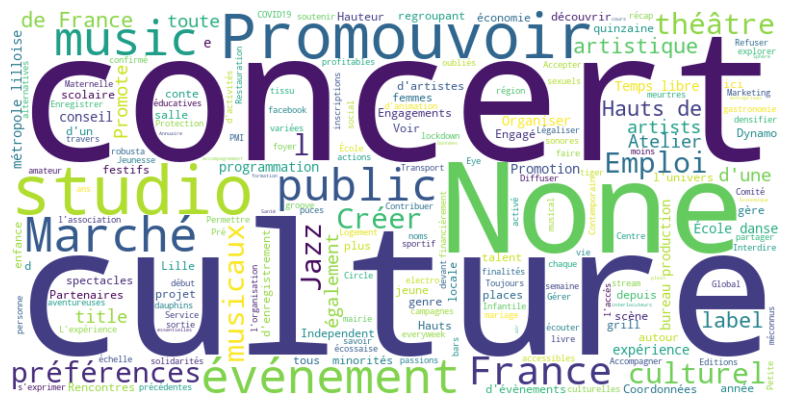

Promotion musique stoner/doom/sludge/post/djent/modern/synthwave Promouvoir musique électronique expérimentale Nouvelle Sounds Good promouvoir musique sous toutes formes milieu rural, prix accessibles tous faire connaître musiciens renommée nationale Promouvoir musique artistes Créer communauté autour musique Promotion musique électronique Collectif musique électronique Lillois Être partenaire aventure musicale Contribuer réalisation projets musicaux plus audacieux promouvoir musique monde tous styles Offrir meilleur musique live Créer réaliser œuvres musicales nouvelles Diffuser œuvres musicales Développer recherche musicale Transmettre œuvres électroacoustiques Pratiquer nouveaux instruments Découvrir nouvelles formes musique portée l’ambition défendre ouverture d’esprit, tolérance diversité culturelle autour musique électronique, Art Point initie N.A.M.E Festival 2005. Art Point conçoit produits diffuse installations urbaines entre arts visuels, musique arts vivants. Remplacer panie

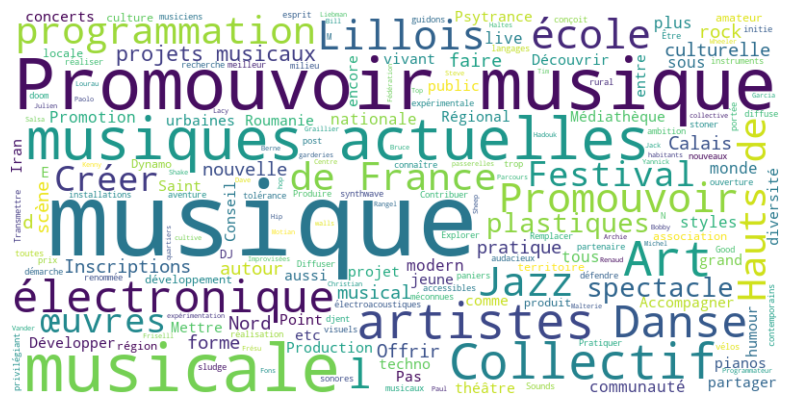

Soutenir artistes locaux Favoriser collaboration entre artistes présenter artistes région Talk : parcours Artistes, Manager Agents. Collaboration d'autres associations artistes Adhesion Concours composition projets créations diffusion Accompagner artistes développement carrière Accompagner artistes soutenir développement talents Mobilisation festive, artistique engagée lieu affiche vitalité, privilégiant initiatives culturelles reposant l'entraide entre structures, telles dispositif Tour Chauffe, réseau Jazz Circle celui Fabriques Culturelles. Mireille Delville Coryne Marliez – entretien accueil artistes Soutenir artistes locaux Soutenir artistes émergents confirmés Donner visibilité artistes femmes Accompagner artistes résidences Collaboration artistes agences production Disposition matériel diffusion Accompagner artistes développement carrière Aider artistes Collaborer structures belges Soutenir artistes locaux Favoriser échanges interculturels mobilité artistes Soutenir création art

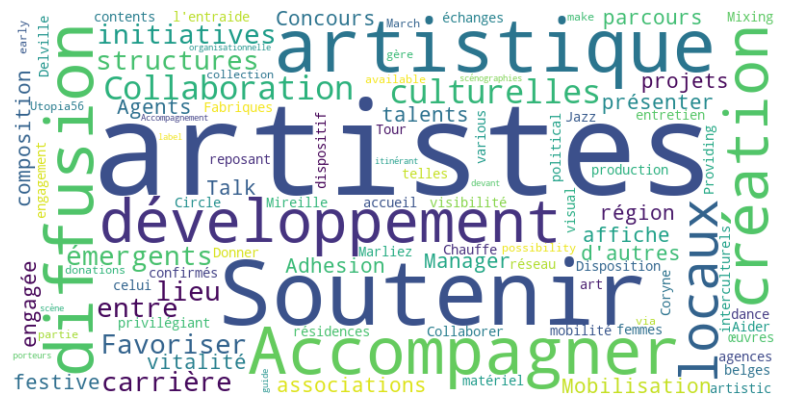

Organiser événements musicaux Organiser événements musicaux Création d'évènements Bass music d'être informé régulièrement événements organisés Traces & Cie Maîtriser toutes facettes l’organisation production d’événements Travailler nombreux partenaires toutes facettes leurs évènements privés Créer événements Organiser événements professionnels Organisation but non lucratif Organiser événements culturels Organisation d’événements Trap / Techno Service événementiel Formation professionnelle Offrir événements qualité Expérience l'événementiel culturel Créer événements mesure Organiser événements culturels Organiser événements musicaux 20 ans l’événement l’an prochain Organiser concerts événements musicaux Organisation d’événements musicaux Organisation d’événements culturels Organiser événements underground techno communauté LGBTQIA+ amis Production d'événements Organiser événements musicaux Organiser événements musicaux artistiques L'ORGANISATION D’ÉVÉNEMENTS CULTURELS événements divers 

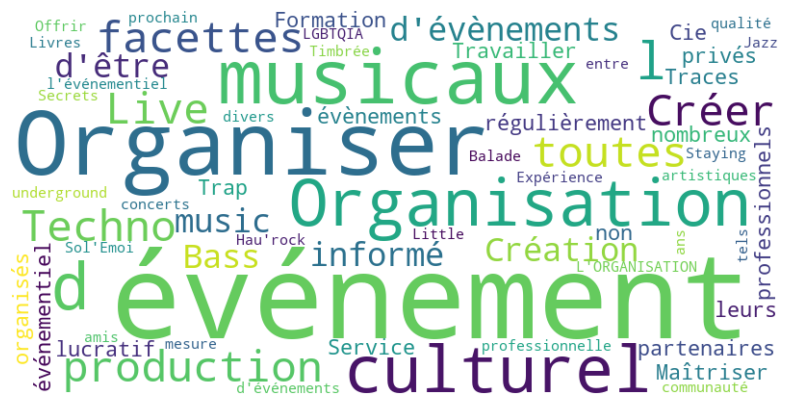

MINICLUB Comala : Restitution Ateliers Mix + sons semaine Ateliers Atelier enfants Atelier ados Atelier ados / adultes Enfance, jeunesse Petite enfance Relais Petite Enfance (Îlot Nounous) L'accueil enfants-parents (îlot piccolo) Enfance, jeunesse
topic :  ['6_enfance_petite_jeunesse_atelier']


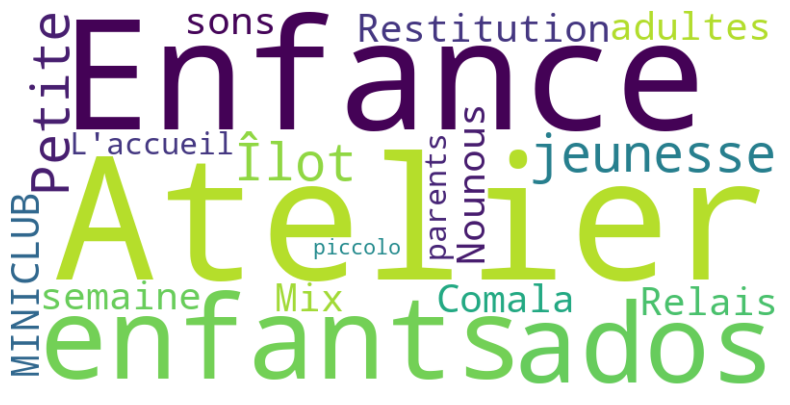

ATELIER MIX Margaux 59000 Contact Fonctionnel Télé Assistance ville recrute ville recrute Ventes mobilières ville Contacts : studioka.net / contact@studioka.net / 03 20 62 96 95 59155 Faches-Thumesnil 03 20 62 96 96 arcades@ville-fachesthumesnil.fr Mardi, jeudi vendredi 14h30-18h30 Mercredi 9h-12h 14h30-18h30 Hôtel ville 59155 Faches-Thumesnil Tél: 03 20 62 61 61 / Fax :03 20 62 61 62 Mail: service.courrier@ville-fachesthumesnil.fr lundi vendredi 8h30-12h 13h30-17h30 Samedi 9h-12h lundi jeudi 8h30-12h 13h30-17h30 Vendredi 8h30-12h Samedi 9h-12h lundi vendredi 8h30 12h Samedi 9h-12h Mail : contact@ville-fachesthumesnil.fr Concentré 3 jours
topic :  ['12_vendredi_9h12h_lundi_8h3012h' '7_62_03_20_ville'
 '-1_none_temps_music_culture']


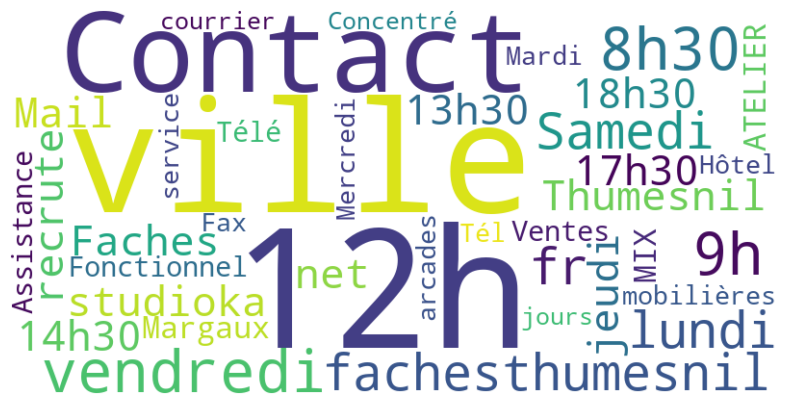

Espace Pro Remplacer signal d'avertissement bus chanson "à queue leu leu" Espace parents Espace Loisirs Jeunes Espaces travail lieu dispose également d'un vaste hall l'exploitation spectacles adaptés bar espace restauration. Signaler anomalie l'espace public Voirie, espaces verts, propreté, éclairage public toute anomalie (affaissement, détérioration, soulèvement, trou trottoir chaussée, encore descellement détérioration d'un potelet d'une barrière), pouvez signaler problème voirie page suivante : espaces verts, propreté l'éclairage public : Sonorisation d'espaces intérieurs extérieurs
topic :  ['-1_none_temps_music_culture']


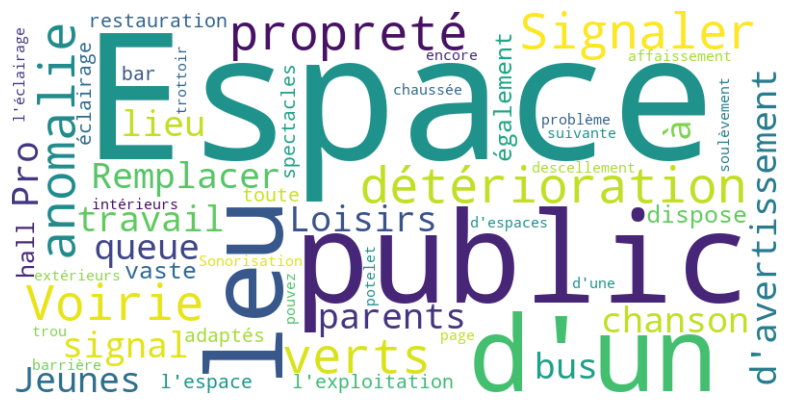

Politique cookies (UE) offrir meilleures expériences, utilisons technologies telles cookies stocker et/ou accéder informations appareils. fait consentir technologies permettra traiter données telles comportement navigation ID uniques site. stockage l’accès technique strictement nécessaire finalité d’intérêt légitime permettre l’utilisation d’un service spécifique explicitement demandé l’abonné l’utilisateur, seul but d’effectuer transmission d’une communication réseau communications électroniques. stockage l’accès technique nécessaire finalité d’intérêt légitime stocker préférences demandées l’abonné l’utilisateur. Statistiques stockage l’accès technique utilisé exclusivement fins statistiques. stockage l’accès technique utilisé exclusivement finalités statistiques anonymes. l’absence d’une assignation comparaître, d’une conformité volontaire part fournisseur d’accès internet d’enregistrements supplémentaires provenant d’une tierce partie, informations stockées extraites cette seule fi

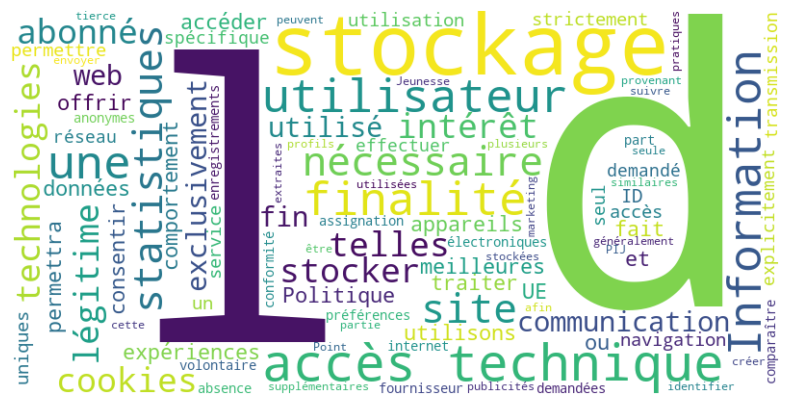

Proposer solutions adaptées besoins spécifiques organisateurs d’événements professionnels Contacter toute demande devis Proposer solutions concrètes innovantes inciter spectateurs devenir acteurs d’une mobilité plus responsable Proposer solutions mise relation entre spectateurs favoriser covoiturage copiétonnage Proposer offres solutions mobilité service mise relation entre spectateurs favoriser covoiturage copiétonnage Proposer service mise relation entre spectateurs partager trajet voiture Proposer service mise relation entre spectateurs partager trajet pieds Proposer service mise relation entre spectateurs partager trajet vélo Proposer service mise relation entre spectateurs partager trajet vélo Proposer service mise relation entre spectateurs partager trajet vélo Proposer service mise relation entre spectateurs partager trajet vélo Proposer service mise relation entre spectateurs partager trajet vélo
topic :  ['10_spectateurs_mise_relation_proposer']


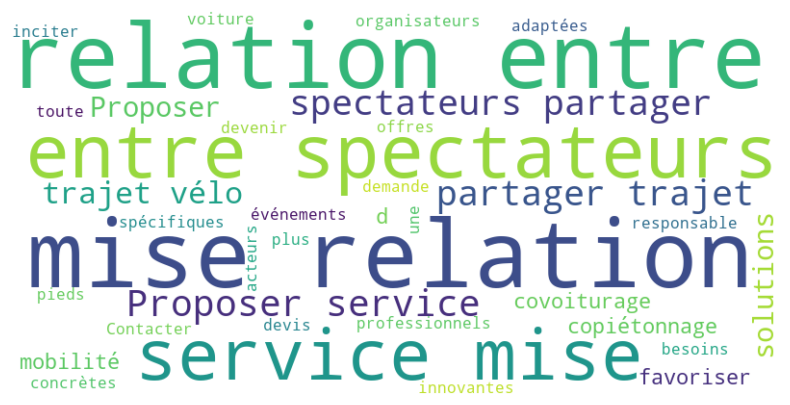

Découvrir Arcades Centre Musical Arcades Découvrir Arcades Centre Musical Arcades propose programmation diversifiée grande qualité, largement ouverte musiques monde, jazz, jeune public l'accompagnement d'artistes régionaux. salle spectacle Arcades possède capacité d'accueil 169 places assises. Studio KA installé l’enceinte Centre Musical Arcades. configuration, d’offrir large éventail prises sons : salle répétition Centre musical Arcades dispose également d'une salle répétition 80m2 entièrement équipée (sonorisation parc instrumental). passés Arcades Centre Musical Arcades Centre Musical Arcades accessible personnes situation handicap Centre Musical Arcades Formations Accompagnement studio Intramurock Haute Fréquence Émission radio musicale focalisée culture club crate-digging
topic :  ['8_arcades_centre_musical_salle']


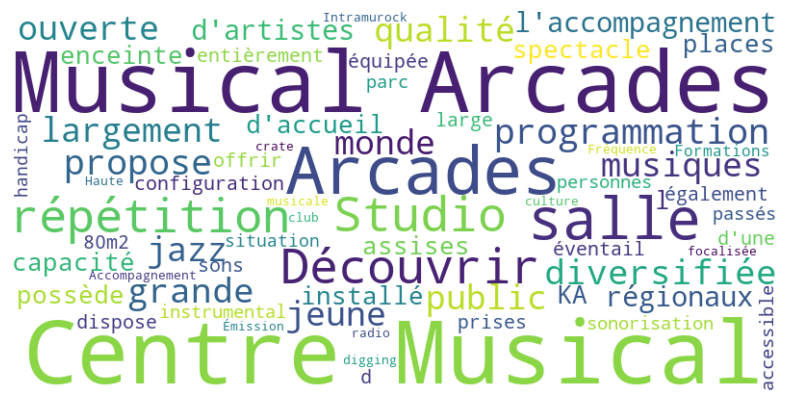

In [114]:
## make a world cloud for each topic
# Créer le Word Cloud

topics = df_objectives['topic_2'].unique()
for topic in topics:
    text_data = " ".join(df_objectives[df_objectives['topic_2']==topic]['objectives'])
    text_data = " ".join([mots for mots in text_data.split() if mots.lower() not in stop_words])
    print(text_data)
    wordcloud = WordCloud(width=800, height=400, background_color='white', colormap='viridis').generate(text_data)
    print('topic : ', df_objectives[df_objectives['topic_2']==topic]['label_1'].unique() )
    # Afficher le Word Cloud
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis("off")  # Cacher les axes
    plt.show()

###     

## Df_offers :

In [118]:
df_offers.dropna( subset=['description'],inplace=True)

In [117]:
df_offers.columns

Index(['index', 'id', 'description', 'name', 'price', 'target_group'], dtype='object')

In [120]:
from bertopic.representation import KeyBERTInspired
import nltk
from nltk.corpus import stopwords

# Télécharger la liste de stop words en français
nltk.download('stopwords')
stop_words = set(stopwords.words('french'))  # Liste des stopwords en français

# Exemple de texte
textes = list(map(str, df_offers['description'].tolist())) 

# Supprimer les stopwords
list_mots_filtres = [[mot for mot in texte.split() if mot.lower() not in stop_words] for texte in textes ]
resultats = [" ".join(mots_filtres).lower() for mots_filtres in list_mots_filtres ] 


# Créer un modèle BERTopic
representation_model = KeyBERTInspired()

# Créer un modèle BERTopic
topic_model = BERTopic(representation_model=representation_model)
# Extraire les topics
topics, probs = topic_model.fit_transform(resultats )

# Ajouter les catégories au dataframe
df_offers['topic_2'] = topics
df_offers = df_offers.merge(topic_model.get_topic_info().rename(columns={'Name':'label_2','Representation': 'representation_2'}),
                                                 right_on = 'Topic',
                                                 left_on = 'topic_2', how = 'left')
# df_objectives['']
# Voir les principaux thèmes
print(topic_model.get_topic_info())

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\axelp\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


   Topic  Count                                 Name  \
0      0    108     0_culturelles_jazz_entre_culture   
1      1     32  1_spectacles_spectacle_rue_palettes   
2      2     28     2_concert_concerts_band_festival   
3      3     25   3_spectacle_cherche_village_troupe   
4      4     16     4_composer_voices_musique_chants   
5      5     11           5_ch4_tshirts_tshirt_metal   

                                      Representation  \
0  [culturelles, jazz, entre, culture, spcialiste...   
1  [spectacles, spectacle, rue, palettes, tournes...   
2  [concert, concerts, band, festival, charleston...   
3  [spectacle, cherche, village, troupe, pierre, ...   
4  [composer, voices, musique, chants, pianistes,...   
5  [ch4, tshirts, tshirt, metal, sweatshirt, post...   

                                 Representative_Docs  
0  [lieu affiche vitalité, privilégiant initiativ...  
1  [spectacles rue variés, spectacles rue variés,...  
2  [concert could seed - the anti noise league @c

Spectacles concerts principaux artistes tournée Concert gratuit Seedy Jeezus Karma Sutra Bulle Café - Maison Folie Moulins Événement musical artistes locaux Valable jusqu'au 14 mars ⏱️ Ça vient sortir ! Shotgun propose progamme cashback récupères cash ambassadeur l'événement ! Comment ça passe ?… voir plus Valable jusqu'au 14 mars ⏱️ Ça vient sortir ! Shotgun propose progamme cashback récupères cash ambassadeur l'événement ! Comment ça passe ?… voir plus Musiques actuelles Samedi 23 novembre 2024 partir 20h l'Horloge d'Ollencourt, commune Tracy-le-Mont. Entrée 15 €, gratuit - 13 ans Musiques actuelles Samedi 23 novembre 2024 partir 20h l'Horloge d'Ollencourt, commune Tracy-le-Mont. Entrée 15 €, gratuit - 13 ans Présenté troupe Oui nous, alors Dimanche 1er decembre 2024 17h CSCI Couloisy, rue coll�ge, Couloisy. Entrée 10 €, gratuit - 13 ans l’idée Rap’Conte, spectacle créé 2021, où Corentin jouait rappeur décomplexé s’amusant contes traditionnels qu’il mettait musique, “Chansons g

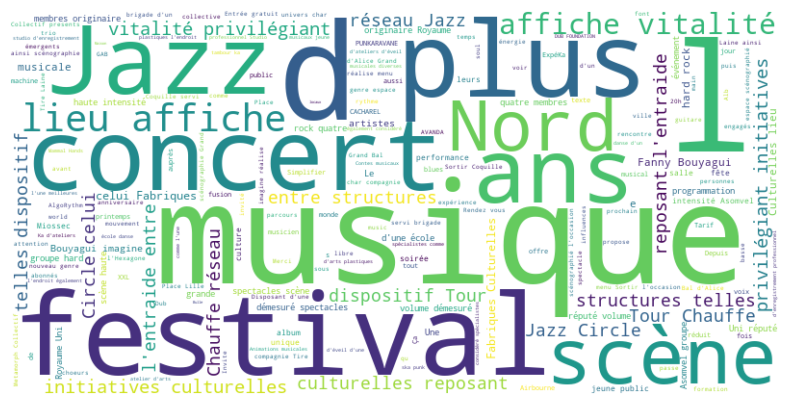

Concert featuring Dimimagery and Nakedsoftmen.band Concert featuring Dimimagery and Nakedsoftmen.band Concert featuring Dimimagery and Nakedsoftmen.band Concert featuring Dimimagery and Nakedsoftmen.band First gig after movie featuring CHRISTIAN THE SEAGULL + DJ SIMPLE Concert featuring IDEAL LIVING (UK) and ALIISSON (FR) Concert featuring FEMUR (UK) and ANTIMOINE (FR) Concerts spectacles Concerts punk Hardcore cold wave Aire Lys. Concert ODA - MAD ACT @1001 BIERES AMIENS Concert COULD SEED - THE ANTI NOISE LEAGUE @CHARLESTON Concert COULD SEED - THE ANTI NOISE LEAGUE @CHARLESTON Concert COULD SEED - THE ANTI NOISE LEAGUE @CHARLESTON Concert COULD SEED - THE ANTI NOISE LEAGUE @CHARLESTON Concert COULD SEED - THE ANTI NOISE LEAGUE @CHARLESTON Live session Concert Nicolas Paugam Band Concert Skeleton Band Concert Skeleton Band Concert Skeleton Band Concert Vagalam Concert Vagalam Concert Vagalam Concert Scieur Z Réduction 50% concerts transports commun Enregistrement sets DJs Concert com

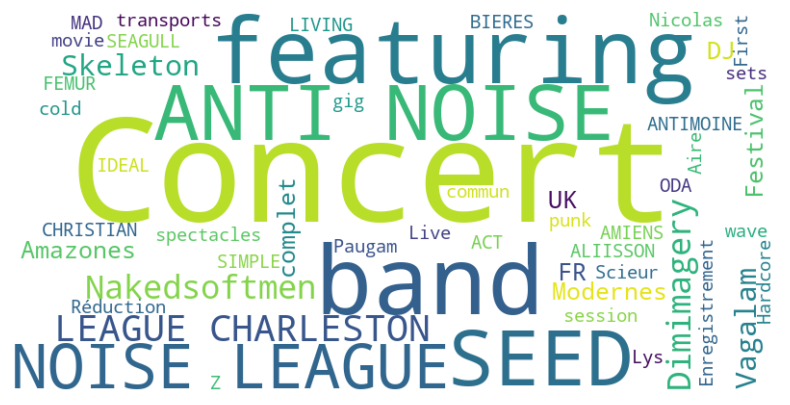

None labyrinthe 3 000 m2 (100 long x 30 large) constitué 8 000 tournesols disposés 5 000 palettes bois. None Spectacle magnifique Sandra Nkaké None Spectacles rue variés Spectacles rue variés Spectacles rue variés Spectacles rue variés Spectacles rue variés Spectacles rue variés Spectacles rue variés Spectacles rue variés Spectacles rue variés Spectacles rue variés Spectacles rue variés Spectacles rue variés Spectacles rue variés Spectacles rue variés Spectacles rue variés Spectacles rue variés Spectacles rue variés Spectacles rue variés Spectacles rue variés Spectacles rue variés Spectacles rue variés Spectacles rue variés Spectacles rue variés Spectacles rue variés Spectacles rue variés Spectacles rue variés Spectacles rue variés
topic :  ['1_spectacles_spectacle_rue_palettes']


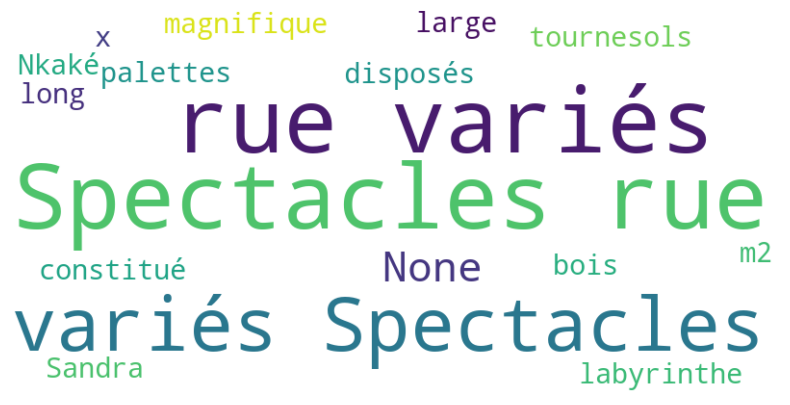

T-shirt Sweatshirt Newrave T-shirts Metal CH4 T-shirts Metal CH4 T-shirts Metal CH4 T-shirts Metal CH4 T-shirts Metal CH4 T-shirts Metal CH4 T-shirts Metal CH4 T-shirts Metal CH4 T-shirts Metal CH4 A night of 100% post-metal with QueenAres, DDENT, and MEMBRANE.
topic :  ['5_ch4_tshirts_tshirt_metal']


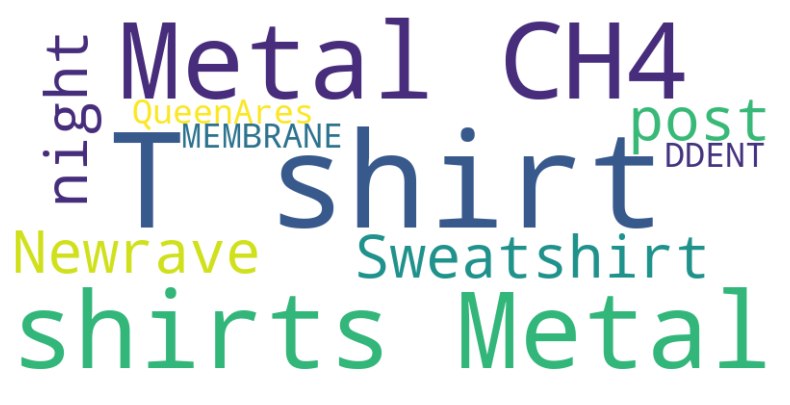

composition Jean-Luc Guionnet dédié claveciniste Barbara Dang clavecin double clavier composition Jean-Luc Guionnet dédié claveciniste Barbara Dang clavecin double clavier composition Jean-Luc Guionnet dédié claveciniste Barbara Dang clavecin double clavier composition Jean-Luc Guionnet dédié claveciniste Barbara Dang clavecin double clavier composition Jean-Luc Guionnet dédié claveciniste Barbara Dang clavecin double clavier composition Jean-Luc Guionnet dédié claveciniste Barbara Dang clavecin double clavier composition Jean-Luc Guionnet dédié claveciniste Barbara Dang clavecin double clavier composition Jean-Luc Guionnet dédié claveciniste Barbara Dang clavecin double clavier composition Jean-Luc Guionnet dédié claveciniste Barbara Dang clavecin double clavier paysages arides, baignés lumière, où matière s’apaise… Si compositions Kham Meslien évoquent grands espaces, c’est musicien emprunte puissance narrative contrebasse chaleur mélodies accrocheuses. Accompagné d’un looper d’effet

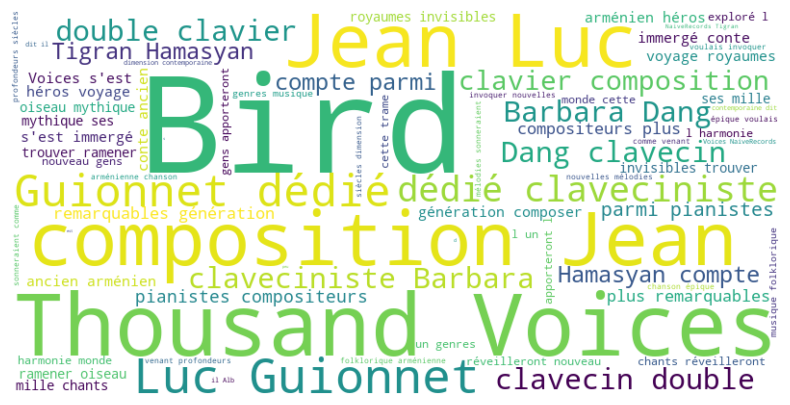

Spectacle théâtre hommage Pierre Dac: 'Idiot cherche village' Spectacle théâtre hommage Pierre Dac: 'Idiot cherche village' Spectacle théâtre hommage Pierre Dac: 'Idiot cherche village' Spectacle théâtre hommage Pierre Dac: 'Idiot cherche village' Spectacle théâtre hommage Pierre Dac: 'Idiot cherche village' Spectacle théâtre hommage Pierre Dac: 'Idiot cherche village' Spectacle théâtre hommage Pierre Dac: 'Idiot cherche village' Spectacle théâtre hommage Pierre Dac: 'Idiot cherche village' Spectacle théâtre hommage Pierre Dac: 'Idiot cherche village' Spectacle théâtre hommage Pierre Dac: 'Idiot cherche village' Spectacle théâtre hommage Pierre Dac: 'Idiot cherche village' Spectacle théâtre hommage Pierre Dac: 'Idiot cherche village' Spectacle théâtre hommage Pierre Dac: 'Idiot cherche village' Spectacle théâtre hommage Pierre Dac: 'Idiot cherche village' Spectacle théâtre hommage Pierre Dac: 'Idiot cherche village' Spectacle théâtre hommage Pierre Dac: 'Idiot cherche village' Spectacl

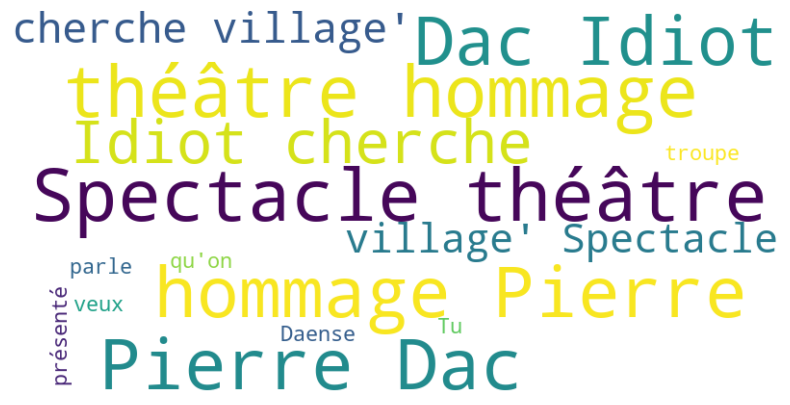

In [123]:
## make a world cloud for each topic
# Créer le Word Cloud

topics = df_offers['topic_2'].unique()
for topic in topics:
    text_data = " ".join(df_offers[df_offers['topic_2']==topic]['description'])
    text_data = " ".join([mots for mots in text_data.split() if mots.lower() not in stop_words])
    print(text_data)
    wordcloud = WordCloud(width=800, height=400, background_color='white', colormap='viridis').generate(text_data)
    print('topic : ', df_offers[df_offers['topic_2']==topic]['label_2'].unique() )
    # Afficher le Word Cloud
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis("off")  # Cacher les axes
    plt.show()

## df_activities :

In [128]:
df_activities.columns

Index(['index', 'id', 'name', 'price'], dtype='object')

In [130]:
df_activities.dropna( subset=['name'],inplace=True)

In [131]:
from bertopic.representation import KeyBERTInspired
import nltk
from nltk.corpus import stopwords

# Télécharger la liste de stop words en français
nltk.download('stopwords')
stop_words = set(stopwords.words('french'))  # Liste des stopwords en français

# Exemple de texte
textes = list(map(str, df_activities['name'].tolist())) 

# Supprimer les stopwords
list_mots_filtres = [[mot for mot in texte.split() if mot.lower() not in stop_words] for texte in textes ]
resultats = [" ".join(mots_filtres).lower() for mots_filtres in list_mots_filtres ] 


# Créer un modèle BERTopic
representation_model = KeyBERTInspired()

# Créer un modèle BERTopic
topic_model = BERTopic(representation_model=representation_model)
# Extraire les topics
topics, probs = topic_model.fit_transform(resultats )

# Ajouter les catégories au dataframe
df_activities['topic_2'] = topics
df_activities = df_activities.merge(topic_model.get_topic_info().rename(columns={'Name':'label_2','Representation': 'representation_2'}),
                                                 right_on = 'Topic',
                                                 left_on = 'topic_2', how = 'left')
# df_objectives['']
# Voir les principaux thèmes
print(topic_model.get_topic_info())



[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\axelp\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


    Topic  Count                                             Name  \
0      -1     27                    -1_femur_antimoine_billy_zinc   
1       0     73             0_concert_fvrier_festival_tournesols   
2       1     72                                    1_pop_up_app_   
3       2     42                       2_aperomix_arkose_apromix_   
4       3     31                                  3_gunfingerz___   
5       4     26                      4_soutenez_parti_titre_sans   
6       5     25                    5_snowy_party_halloween_house   
7       6     24                               6_trobar_project__   
8       7     22                7_punk_concert_hardcore_metalcore   
9       8     20                   8_northbass_speaker_tmpa_louis   
10      9     20               9_gunfingerz_bassline_bass_edition   
11     10     19                  10_cycles_lights_cubes_carnaval   
12     11     19            11_frenchcore_drum_neurofunk_drumbass   
13     12     19                  

In [134]:
df_activities

,index,id,name,price,topic_2,Topic,Count,label_2,representation_2,Representative_Docs
0,0,0,Le Cabaret des Bains,NaN,19,19,14,19_cabaret_festival_soire_effetmer,"[cabaret, festival, soire, effetmer, bains, , ...","[soirée cabaret festival, soirée cabaret festi..."
1,0,0,Le Cabaret des Bains,NaN,19,19,14,19_cabaret_festival_soire_effetmer,"[cabaret, festival, soire, effetmer, bains, , ...","[soirée cabaret festival, soirée cabaret festi..."
2,1,1,EFFET.MER Festival,NaN,19,19,14,19_cabaret_festival_soire_effetmer,"[cabaret, festival, soire, effetmer, bains, , ...","[soirée cabaret festival, soirée cabaret festi..."
3,3,3,Concerts,NaN,23,23,13,23_concerts_concert_festivals_booking,"[concerts, concert, festivals, booking, specta...","[concerts, concerts, concerts]"
4,3,3,Concerts,NaN,23,23,13,23_concerts_concert_festivals_booking,"[concerts, concert, festivals, booking, specta...","[concerts, concerts, concerts]"
...,...,...,...,...,...,...,...,...,...,...
643,168,168,soutenez le parti sans cible,NaN,4,4,26,4_soutenez_parti_titre_sans,"[soutenez, parti, titre, sans, cible, dernire,...","[soutenez parti sans cible, soutenez parti san..."
644,168,168,soutenez le parti sans cible,NaN,4,4,26,4_soutenez_parti_titre_sans,"[soutenez, parti, titre, sans, cible, dernire,...","[soutenez parti sans cible, soutenez parti san..."
645,168,168,soutenez le parti sans cible,NaN,4,4,26,4_soutenez_parti_titre_sans,"[soutenez, parti, titre, sans, cible, dernire,...","[soutenez parti sans cible, soutenez parti san..."
646,168,168,soutenez le parti sans cible,NaN,4,4,26,4_soutenez_parti_titre_sans,"[soutenez, parti, titre, sans, cible, dernire,...","[soutenez parti sans cible, soutenez parti san..."


Cabaret Bains Cabaret Bains EFFET.MER Festival Soirée Cabaret Festival Soirée Cabaret Festival Soirée Cabaret Festival Soirée Cabaret Festival Soirée Cabaret Festival Soirée Cabaret Festival Soirée Cabaret Festival Soirée Cabaret Festival Soirée Cabaret Festival Soirée Cabaret Festival Soirée Cabaret Festival
topic :  ['19_cabaret_festival_soire_effetmer']


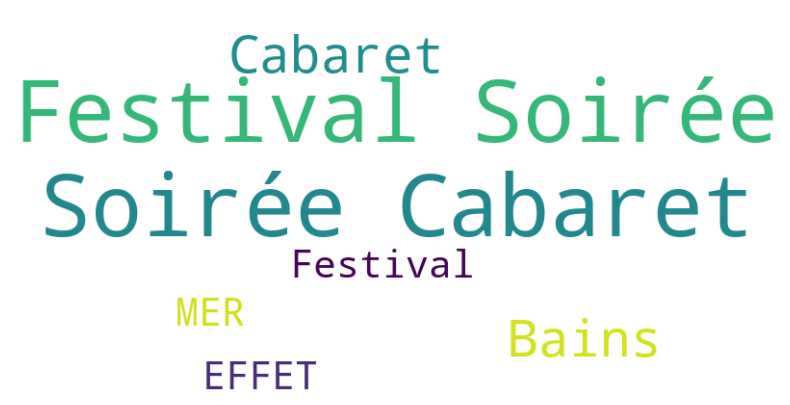

Concerts Concerts Concerts Concerts Pièces théâtre Spectacles Spectacles Concert with Dimimagery and Nakedsoftmen.band Concerts Booking artistes Concerts Festivals Production spectacles
topic :  ['23_concerts_concert_festivals_booking']


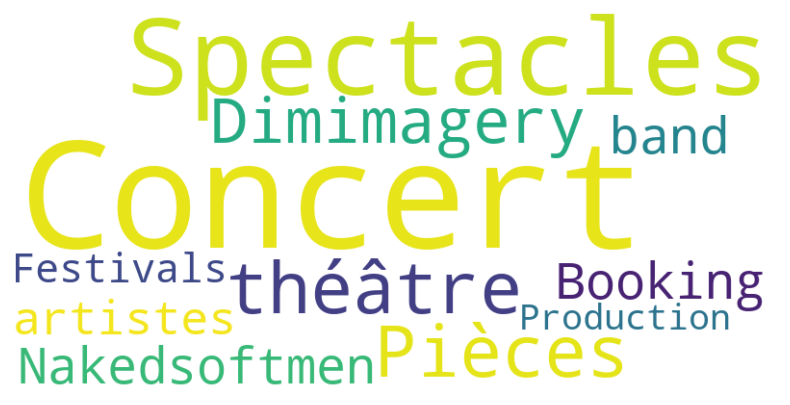

1ST GIG AFTER MOVIE: CHRISTIAN THE SEAGULL + DJ SIMPLE Concert GINGER KICK : ADAM BOMB (US) + VEDETTE / Bulle Café 04-04-2025 Concert Seedy Jeezus Karma Sutra Concert 2 février Concert 2 février Concert 2 février Concert 2 février Concert 2 février Concert 2 février Concert 2 février Concert 2 février Concert 2 février Concert 2 février Concert 2 février Concert 2 février Concert 2 février Concert 2 février Concert 2 février Concert 2 février Concert 2 février Concert 2 février Concert 2 février Concert 2 février Concert 2 février Concert 2 février Concert 2 février Concert 2 février Concert 2 février Concert 2 février Concert 2 février Concert 2 février Concert 2 février Concert 2 février Concert 2 février Concert 2 février Concert 2 février Concert 2 février Concert 2 février Concert 2 février Concert 2 février Concert 2 février Concert 2 février Concert 2 février Concert 2 février Concert 2 février Concert 2 février Concert 2 février Concert 2 février Concert 2 février Concert 2 fév

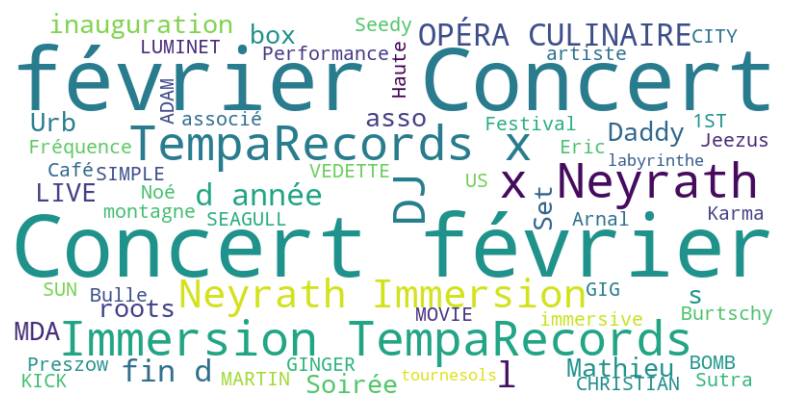

(ANNULE) Billy Society présente IDEAL LIVING (UK) + ALIISSON (FR) Billy Society présente FEMUR (UK) + ANTIMOINE (FR) Billy Society présente FEMUR (UK) + ANTIMOINE (FR) Billy Society présente FEMUR (UK) + ANTIMOINE (FR) Billy Society présente FEMUR (UK) + ANTIMOINE (FR) Merch Merch Merch Merch Tech House zinc x Tempa Records Drum and Bass Zinc x Tempa Records Drum and Bass Zinc x Tempa Records Drum and Bass Zinc x Tempa Records Dj Set Zinc x Tempa Records Dj Set Zinc x Tempa Records W / Wazemmes : Babush X Tempa Records 175 BPM ( Only Drum'n'Bass ) Parade Toutes tous fleurs Régalez-vous ! Régalez-vous ! Régalez-vous ! Régalez-vous ! Régalez-vous ! Régalez-vous ! Régalez-vous ! Régalez-vous ! Régalez-vous !
topic :  ['-1_femur_antimoine_billy_zinc']


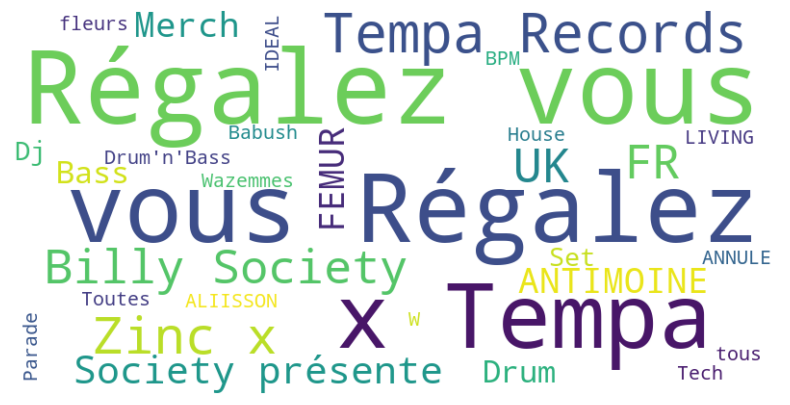

Événement Hardcore / Metalcore Événement Hardcore / Metalcore Événement Hardcore / Metalcore Événements Pure Open Air 2025 Concert punk Hardcore cold wave Concert punk Hardcore cold wave Concert punk Hardcore cold wave Concert punk Hardcore cold wave Concert punk Hardcore cold wave Concert punk Hardcore cold wave Concert punk Hardcore cold wave Concert punk Hardcore cold wave Concert punk Hardcore cold wave Concert punk Hardcore cold wave Concert punk Hardcore cold wave Concert punk Hardcore cold wave Concert punk Hardcore cold wave Concert punk Hardcore cold wave Concert punk Hardcore cold wave Amikal Sonic's saturday Confined Clubbing livestream Performance fantôme
topic :  ['7_punk_concert_hardcore_metalcore']


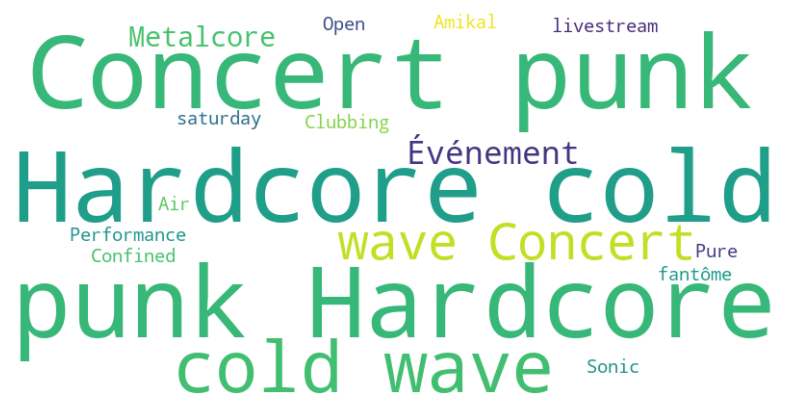

None Gunfingerz Bass music Edition Gunfingerz Bass music Edition Gunfingerz - D&B edition GUNFINGERZ - Bassline édition GUNFINGERZ - Bassline édition GUNFINGERZ - Bassline édition GUNFINGERZ - Bassline édition GUNFINGERZ - Bassline édition GUNFINGERZ - Bassline édition GUNFINGERZ - Bassline édition GUNFINGERZ - Bassline édition Gunfingerz - One87 / Taos Gunfingerz - One87 / Taos Gunfingerz - One87 / Taos NO COMMENT NO COMMENT NO COMMENT NO COMMENT NO COMMENT
topic :  ['9_gunfingerz_bassline_bass_edition']


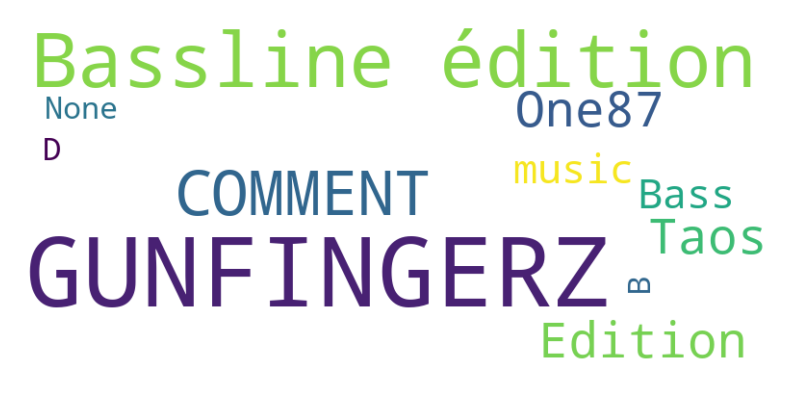

Émissions Lights & VJ Cycles #2 #3 Cycles Cycles Cycles Cycles Cycles Cycles Cycles Cycles Cycles Cycles Cycles Cycles Cycles Expérience vol#3 Golden Cubes CARNAVAL ELECTRO
topic :  ['10_cycles_lights_cubes_carnaval']


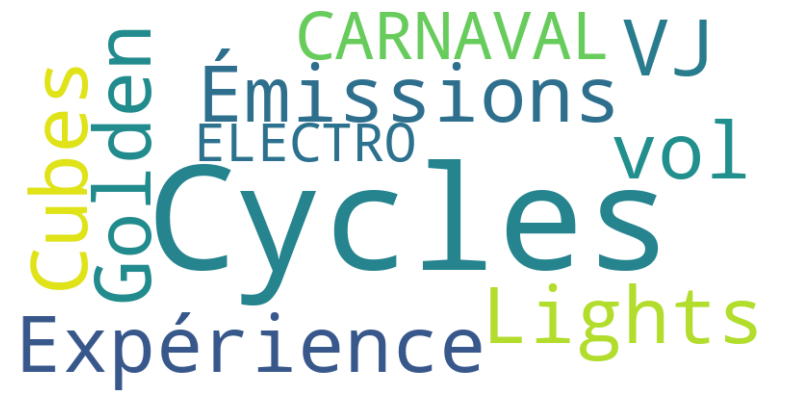

C’était quoi titre? Revisiter esthétiques classiques d’ici d’ailleurs Revisiter esthétiques classiques d’ici d’ailleurs Revisiter esthétiques classiques d’ici d’ailleurs Revisiter esthétiques classiques d’ici d’ailleurs SI CENDRILLON N’AVAIT EXISTÉ... NOEL AVANT L'HEURE PARTI SANS CIBLE NOEL AVANT L'HEURE PARTI SANS CIBLE NOEL AVANT L'HEURE PARTI SANS CIBLE Dernière ligne droite avant virage mur l'espace municipal !!! Dernière ligne droite avant virage mur l'espace municipal !!! Dernière ligne droite avant virage mur l'espace municipal !!! Dernière ligne droite avant virage mur l'espace municipal !!! soutenez parti sans cible soutenez parti sans cible soutenez parti sans cible soutenez parti sans cible soutenez parti sans cible soutenez parti sans cible soutenez parti sans cible soutenez parti sans cible soutenez parti sans cible soutenez parti sans cible soutenez parti sans cible soutenez parti sans cible soutenez parti sans cible
topic :  ['4_soutenez_parti_titre_sans']


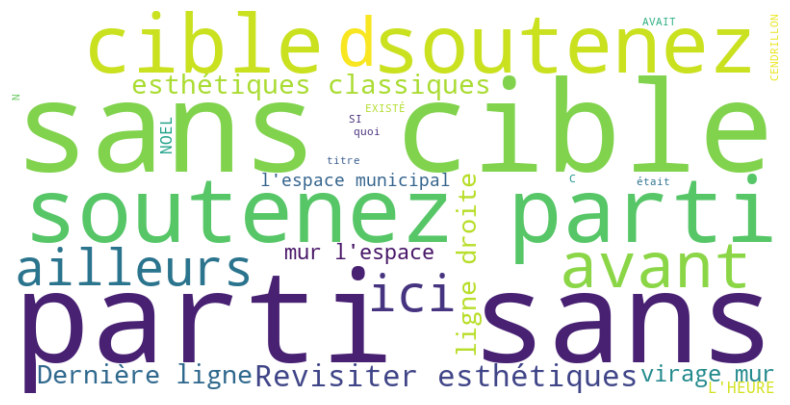

App POP UP POP UP POP UP POP UP POP UP POP UP POP UP POP UP POP UP POP UP POP UP POP UP POP UP POP UP POP UP POP UP POP UP POP UP POP UP POP UP POP UP POP UP POP UP POP UP POP UP POP UP POP UP POP UP POP UP POP UP POP UP POP UP POP UP POP UP POP UP POP UP POP UP POP UP POP UP POP UP POP UP POP UP POP UP POP UP POP UP POP UP POP UP POP UP POP UP POP UP POP UP POP UP POP UP POP UP POP UP POP UP POP UP POP UP POP UP POP UP POP UP POP UP POP UP POP UP POP UP POP UP POP UP POP UP POP UP POP UP POP UP
topic :  ['1_pop_up_app_']


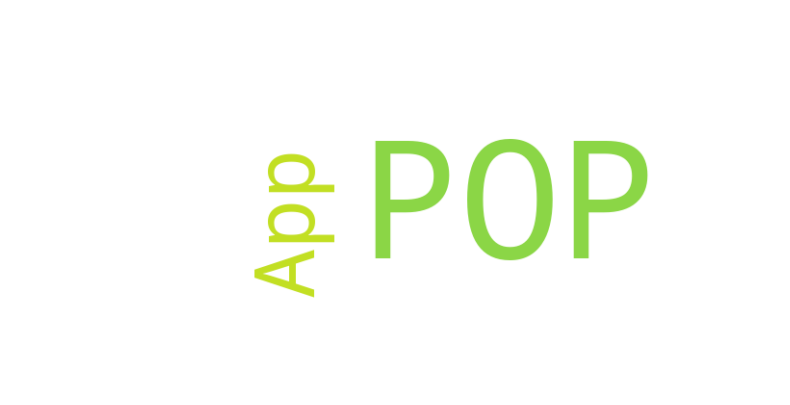

Soirée Beaujolais Soirée Beaujolais Recrutement teufs Milou #2 Teufs Milou #1 Coordination suivi projet Noces Rétameur Eshareh Soirée Why not II Eurockéennes Eurockéennes BIENVENUS BIENVENUS BIENVENUS
topic :  ['21_bienvenus_teufs_milou_beaujolais']


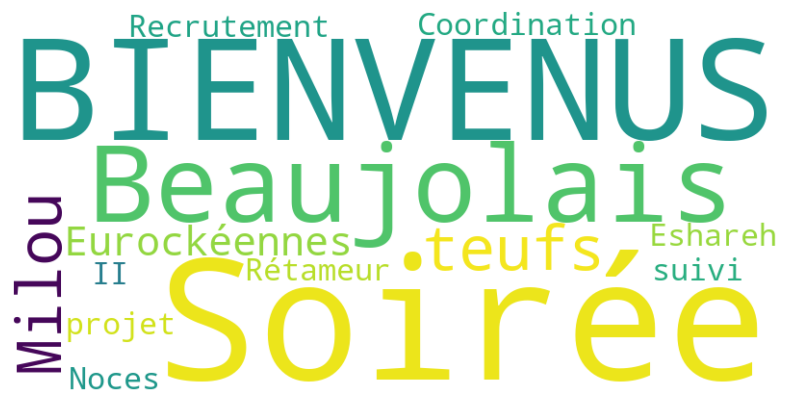

Boum lancement Boum lancement NorthBass Warm Up NorthBass warm up North Bass North Bass North Bass North Bass North Bass FRIP N' BASS FRIP N' BASS BASS ARRIÈRE #1 / TMPA X JAKA BASS ARRIÈRE #1 / TMPA X JAKA BASS ARRIÈRE #1 / TMPA X JAKA BOUM BOUM (Tech House // UK Bass)
topic :  ['17_bass_northbass_north_warm']


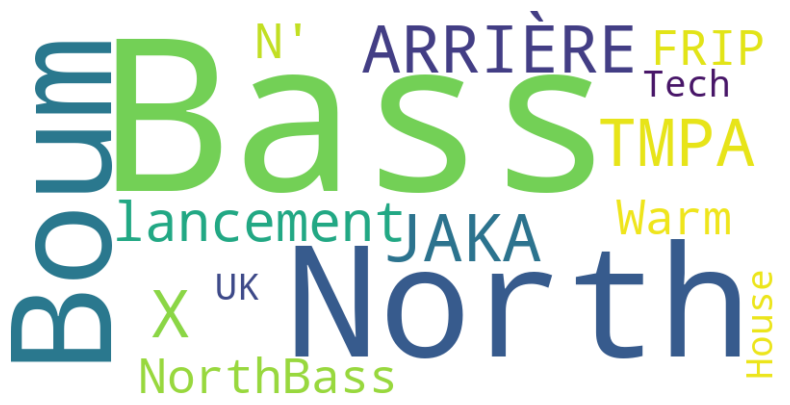

Jardin d'Hiver Jardin d'Hiver Jardin d'Hiver Jardin d'Hiver Jardin d'Hiver Jardin d'Hiver Jardin Electronique Karnây Anâssor Résidence secondaire d'hiver Résidence secondaire d'hiver Résidence secondaire d'hiver Résidence secondaire d'hiver Résidence secondaire d'hiver
topic :  ['20_jardin_anssor_karny_rsidence']


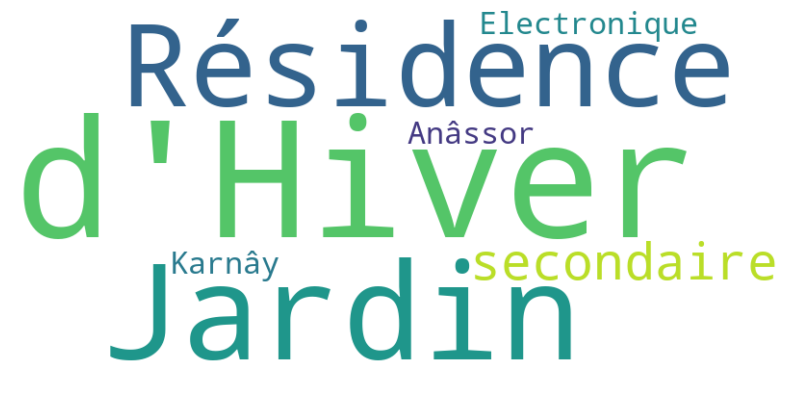

Newsletter Newsletter Newsletter Newsletter Parade lille3000 Eldorado Magnifik Parade Magnifik Parade Magnifik Parade Magnifik Parade Magnifik Parade DRAGUE Show Drag Queer
topic :  ['27_magnifik_parade_newsletter_drag']


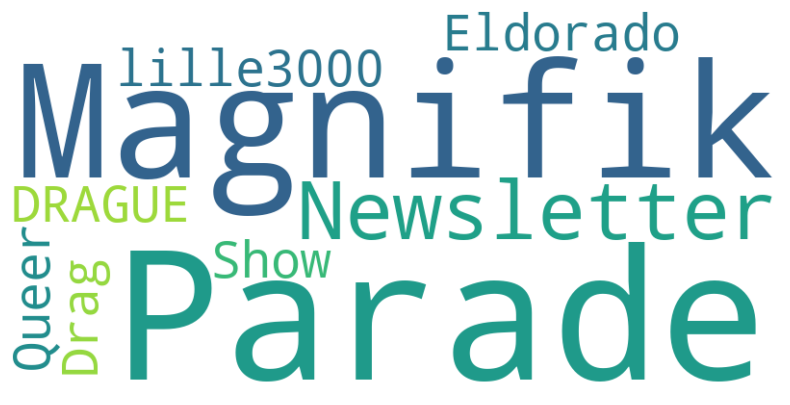

Homelloween #03 : Drum&Bass - Jump Up - Neurofunk - Frenchcore Homelloween #03 : Drum&Bass - Jump Up - Neurofunk - Frenchcore Homelloween #03 : Drum&Bass - Jump Up - Neurofunk - Frenchcore Homelloween #03 : Drum&Bass - Jump Up - Neurofunk - Frenchcore Homelloween #03 : Drum&Bass - Jump Up - Neurofunk - Frenchcore Homelloween #03 : Drum&Bass - Jump Up - Neurofunk - Frenchcore Homelloween #03 : Drum&Bass - Jump Up - Neurofunk - Frenchcore Homelloween #03 : Drum&Bass - Jump Up - Neurofunk - Frenchcore Homelloween #03 : Drum&Bass - Jump Up - Neurofunk - Frenchcore Homelloween #03 : Drum&Bass - Jump Up - Neurofunk - Frenchcore Homelloween - Drum and Bass #2 Local Underground #1 SMACK MY BEAT UP - Soirée DNB, GARAGE & JUNGLE SMACK MY BEAT UP - Soirée DNB, GARAGE & JUNGLE SMACK MY BEAT UP - Soirée DNB, GARAGE & JUNGLE SMACK MY BEAT UP - Soirée DNB, GARAGE & JUNGLE L’ensemble ARBORESCENCE PIANO - PLATINES Foule Power
topic :  ['11_frenchcore_drum_neurofunk_drumbass']


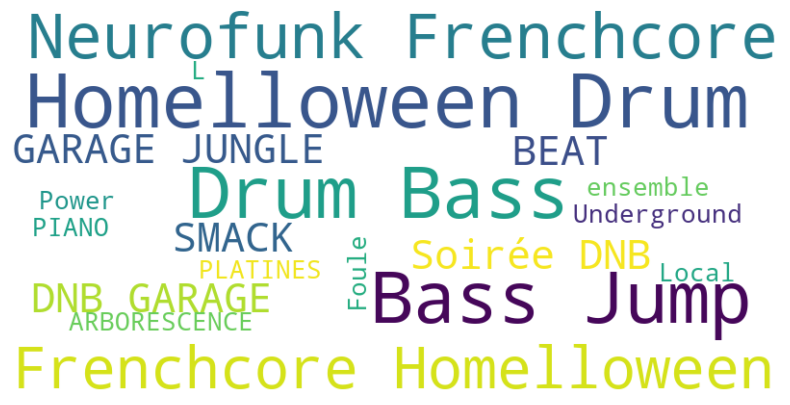

NorthBass XL Edition - Visages + Speaker Louis + TMPA Crew NorthBass XL Edition - Visages + Speaker Louis + TMPA Crew NorthBass XL Edition - Visages + Speaker Louis + TMPA Crew NorthBass XL Edition - Visages + Speaker Louis + TMPA Crew NorthBass XL Edition - Visages + Speaker Louis + TMPA Crew NorthBass XL Edition - Visages + Speaker Louis + TMPA Crew NorthBass XL Edition - Visages + Speaker Louis + TMPA Crew NorthBass XL Edition - Visages + Speaker Louis + TMPA Crew NorthBass XL Edition - Visages + Speaker Louis + TMPA Crew NorthBass XL Edition - Visages + Speaker Louis + TMPA Crew NorthBass XL Edition - Visages + Speaker Louis + TMPA Crew NorthBass XL Edition - Visages + Speaker Louis + TMPA Crew NorthBass XL Edition - Visages + Speaker Louis + TMPA Crew NorthBass XL Edition - Visages + Speaker Louis + TMPA Crew NorthBass XL Edition - Visages + Speaker Louis + TMPA Crew NorthBass XL Edition - Visages + Speaker Louis + TMPA Crew NorthBass XL Edition - Visages + Speaker Louis + TMPA Cr

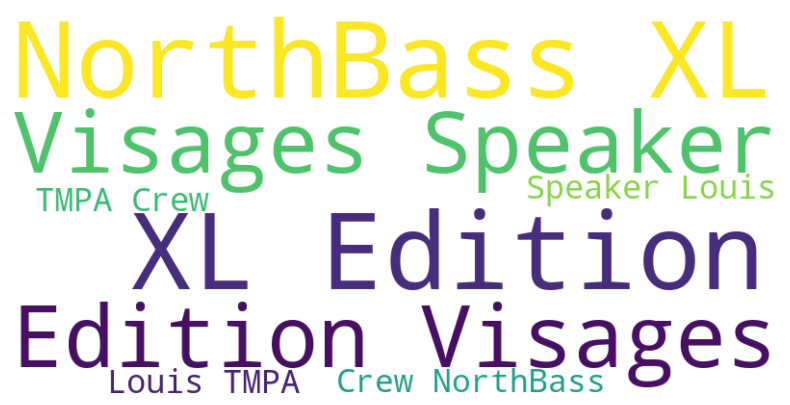

DOWNTERRA RELEASE PARTY • HVDES + DOWNTERRA + INKUBE + TMPA CREW DOWNTERRA RELEASE PARTY • HVDES + DOWNTERRA + INKUBE + TMPA CREW DOWNTERRA RELEASE PARTY • HVDES + DOWNTERRA + INKUBE + TMPA CREW DOWNTERRA RELEASE PARTY • HVDES + DOWNTERRA + INKUBE + TMPA CREW DOWNTERRA RELEASE PARTY • HVDES + DOWNTERRA + INKUBE + TMPA CREW DOWNTERRA RELEASE PARTY • HVDES + DOWNTERRA + INKUBE + TMPA CREW DOWNTERRA RELEASE PARTY • HVDES + DOWNTERRA + INKUBE + TMPA CREW DOWNTERRA RELEASE PARTY • HVDES + DOWNTERRA + INKUBE + TMPA CREW DOWNTERRA RELEASE PARTY • HVDES + DOWNTERRA + INKUBE + TMPA CREW DOWNTERRA RELEASE PARTY • HVDES + DOWNTERRA + INKUBE + TMPA CREW DOWNTERRA RELEASE PARTY • HVDES + DOWNTERRA + INKUBE + TMPA CREW DOWNTERRA RELEASE PARTY • HVDES + DOWNTERRA + INKUBE + TMPA CREW DOWNTERRA RELEASE PARTY • HVDES + DOWNTERRA + INKUBE + TMPA CREW DOWNTERRA RELEASE PARTY • HVDES + DOWNTERRA + INKUBE + TMPA CREW DOWNTERRA RELEASE PARTY • HVDES + DOWNTERRA + INKUBE + TMPA CREW DOWNTERRA RELEASE PARTY •

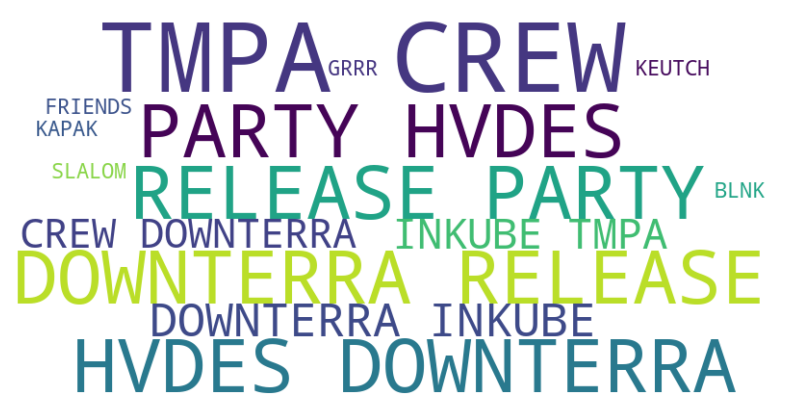

GUNFINGERZ GUNFINGERZ Gunfingerz Gunfingerz Gunfingerz Gunfingerz Gunfingerz Gunfingerz Gunfingerz Gunfingerz Gunfingerz Gunfingerz Gunfingerz Gunfingerz Gunfingerz Gunfingerz GUNFINGERZ GUNFINGERZ Gunfingerz Gunfingerz Gunfingerz Gunfingerz Gunfingerz Gunfingerz Gunfingerz Gunfingerz Gunfingerz Gunfingerz Gunfingerz Gunfingerz Gunfingerz
topic :  ['3_gunfingerz___']


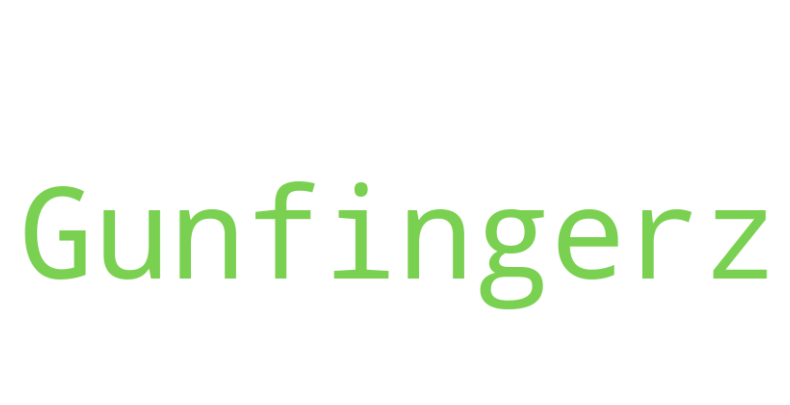

FÊTE MUSIQUE - TMPA CREW @HØME FÊTE MUSIQUE - TMPA CREW @HØME Fête Commune Fête Commune Fête Commune Fête Commune Fête Commune Fête Commune Fête Commune Fête Commune Fête Commune Fête Commune Danse flamenco & musique live Concerto 37 1/2 Ana Pérez Atelier musique • MAO CLUB #1 OmuR.H Why not fête 1 an « Why not lll »
topic :  ['15_commune_fte_danse_club']


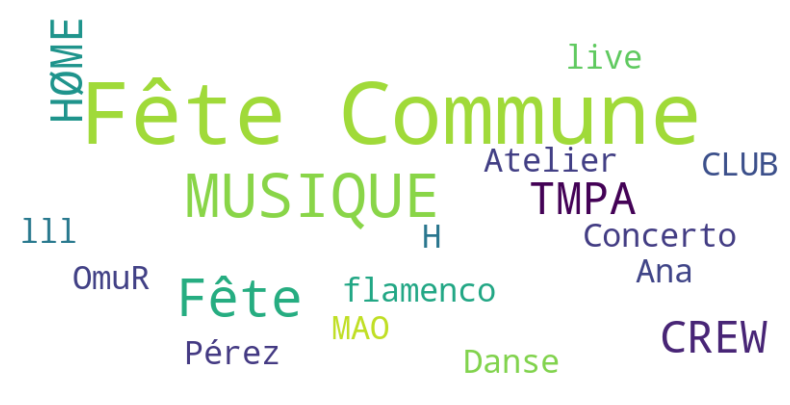

Cailla Birthday @ Chouga Barrio Cailla B2b BLT Cailla B2b BLT Cailla B2b BLT Cailla x Blt / Drum And Bass Relax PINK⎮ FIRST EDITION 2025 Why not Conchil beach club Victor Villafagne (17-21 mars 2025), résidence tremplin Victor Villafagne (2 3 avril 2025), résidence tremplin Victor Villafagne (28-30 avril 2025), résidence tremplin Victor Villafagne (28-30 avril 2025), résidence tremplin Victor Villafagne (5-7 mai 2025), résidence tremplin Raphaël Néron (2-6 juin 2025) Julie Semoroz (25-28 août 2025) Julie Semoroz (25-28 août 2025)
topic :  ['16_villafagne_tremplin_victor_conchil']


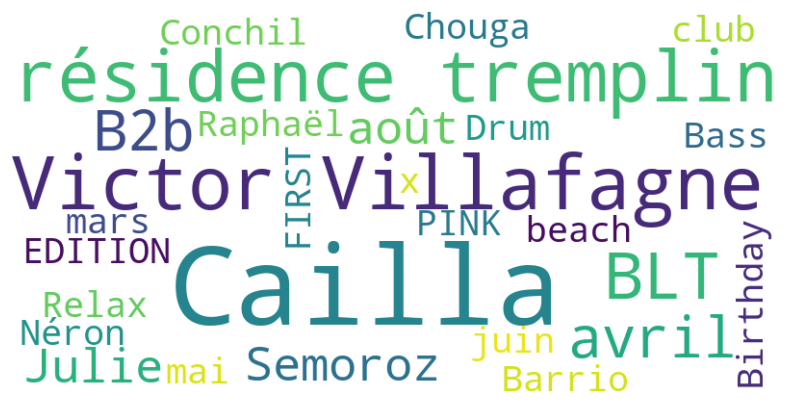

Aperomix - Arkose Aperomix - Arkose Aperomix - Arkose Aperomix - Arkose Aperomix - Arkose Aperomix - Arkose Aperomix - Arkose Aperomix - Arkose Aperomix - Arkose Aperomix - Arkose Aperomix - Arkose Aperomix - Arkose Aperomix - Arkose Aperomix - Arkose Aperomix - Arkose Aperomix - Arkose Aperomix - Arkose Aperomix - Arkose Aperomix - Arkose Aperomix - Arkose Aperomix - Arkose Aperomix - Arkose Aperomix - Arkose Aperomix - Arkose Aperomix - Arkose Aperomix - Arkose Aperomix - Arkose Aperomix - Arkose Aperomix - Arkose Aperomix - Arkose Aperomix - Arkose Aperomix - Arkose Aperomix - Arkose ApéroMix Liquid DnB ApéroMix Liquid DnB ApéroMix Liquid DnB ApéroMix Liquid DnB ApéroMix Liquid DnB ApéroMix Liquid DnB ApéroMix Liquid DnB ApéroMix Liquid DnB ApéroMix Liquid DnB
topic :  ['2_aperomix_arkose_apromix_']


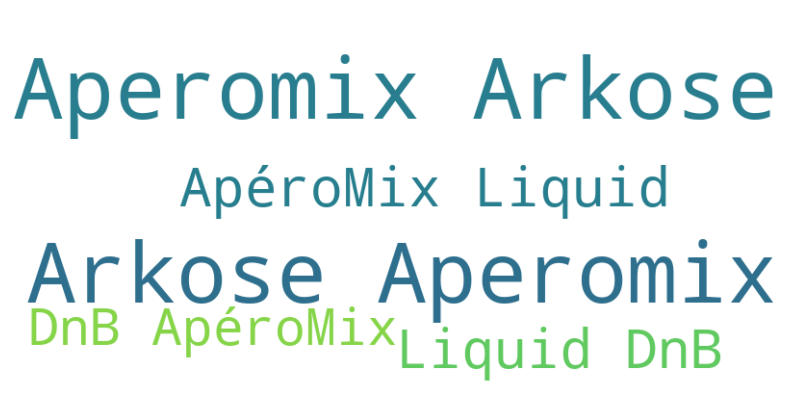

[LONDON TO BERLIN @ HØME] Techno To DnB | Sloan Birthday [LONDON TO BERLIN @ HØME] Techno To DnB | Sloan Birthday [LONDON TO BERLIN @ HØME] Techno To DnB | Sloan Birthday [LONDON TO BERLIN @ HØME] Techno To DnB | Sloan Birthday [LONDON TO BERLIN @ HØME] Techno To DnB | Sloan Birthday We Want Techno at Base Arrière We Want Techno at Base Arrière We Want Techno at Base Arrière London to Berlin London to Berlin London to Berlin
topic :  ['26_dnb_berlin_sloan_london']


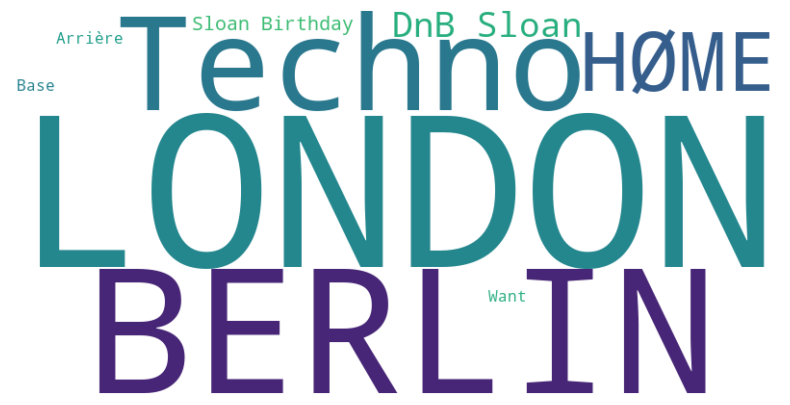

[TALES FROM THE HØME] - Dnb Halloween Party SNOWY PARTY SNOWY PARTY SNOWY PARTY SNOWY PARTY SNOWY PARTY SNOWY PARTY SNOWY PARTY SNOWY PARTY SNOWY PARTY SNOWY PARTY SNOWY PARTY SPOOKY PARTY SPOOKY PARTY SPOOKY PARTY SPOOKY PARTY SPOOKY PARTY SPOOKY PARTY SPOOKY PARTY SPOOKY PARTY SPOOKY PARTY I HAVE A DREAM I HAVE A DREAM CRAZY HOUSE CRAZY HOUSE
topic :  ['5_snowy_party_halloween_house']


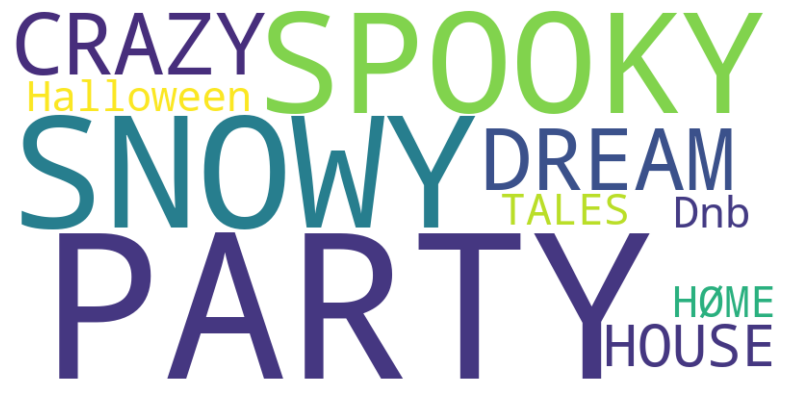

Zinc and Bass #6 Zinc and Bass #6 Zinc and Bass #6 Zinc and Bass #6 Zinc and Bass #6 Zinc and Bass #6 Zinc and Bass #6 Zinc and Bass #2 Zinc and Bass #2 Zinc and Bass Zinc'N Bass#2 Zinc 'n Bass
topic :  ['24_zinc_zincn_bass_bass2']


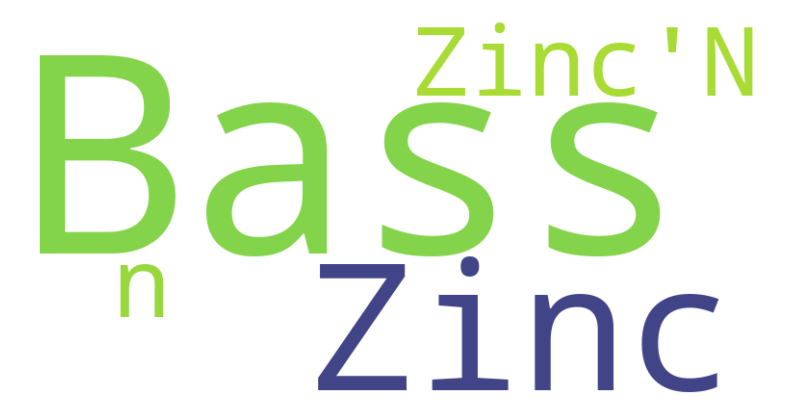

Start and Bass Start and Bass Start and Bass Start and Bass Start and Bass Start and Bass Start' Bass Start' Bass Start' Bass Start' Bass Start' Bass Start' Bass Start' Bass Start' Bass
topic :  ['18_bass_start__']


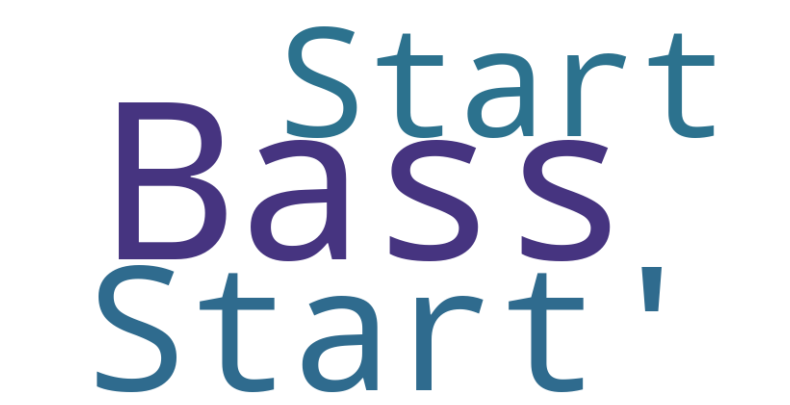

N'importempa by Gastama Drum to Indus [Free Edition] Drum to Indus [Free Edition] Drum to Indus [Free Edition] Drum to Indus [Free Edition] Drum To Indus #3 Drum To Indus #3 Drum To Indus #3 Drum To Indus #3 Drum To Indus Drum To Indus Drum To Indus
topic :  ['25_indus_drum_gastama_to']


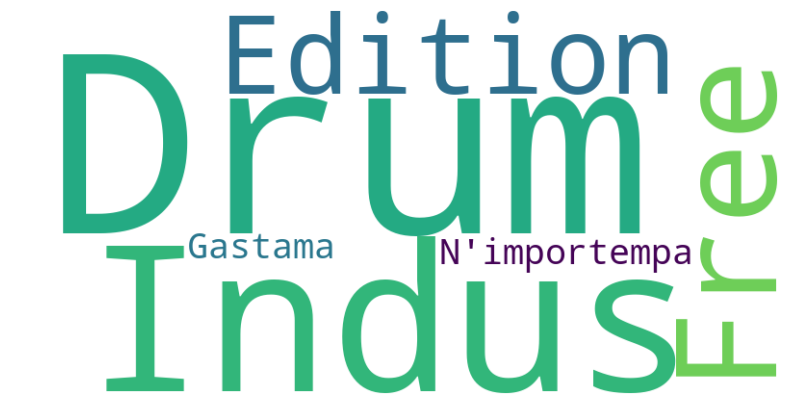

Accompagnement conseil logistique Accompagnement conseil administratif Accompagnement conseil budgétaire comptable Accompagnement conseil recherche solutions innovantes durables Accompagnement conseil recherche solutions innovantes durables Accompagnement conseil recherche solutions innovantes durables Accompagnement conseil recherche solutions innovantes durables Paysages enfers Paysages enfers Paysages enfers Paysages enfers Paysages enfers Paysages enfers Paysages enfers Paysages enfers Paysages enfers Paysages enfers
topic :  ['14_recherche_durables_accompagnement_solutions']


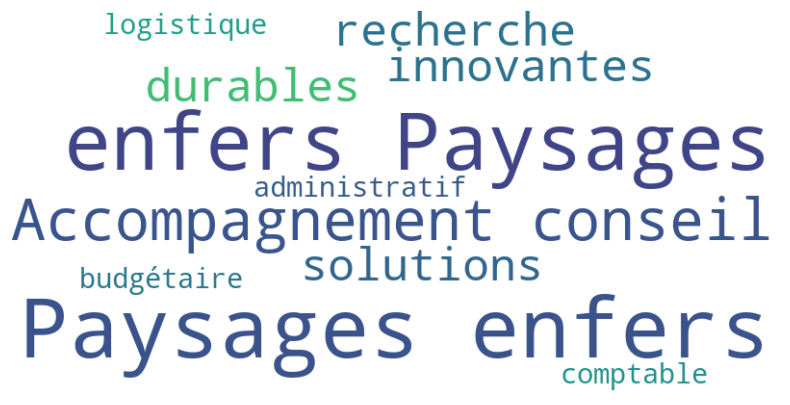

Soirée Cabaret Festival Festival danse Bassin minier Festival danse Bassin minier Festival danse Bassin minier Festival danse Bassin minier Festival danse Bassin minier Festival danse Bassin minier Festival danse Bassin minier Festival danse Bassin minier Festival danse Bassin minier Festival danse Bassin minier Festival danse Bassin minier Festival danse Bassin minier Festival danse Bassin minier Festival danse Bassin minier Promotion locale Banquet Céramique Banquet Céramique
topic :  ['13_danse_festival_minier_bassin']


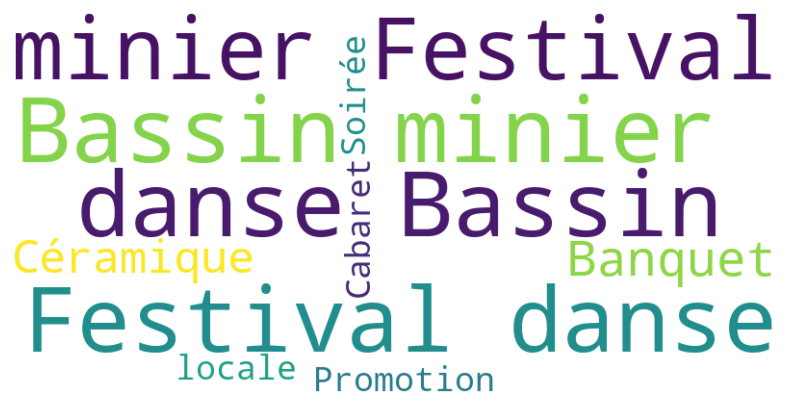

Trobar Project Trobar Project Trobar Project Trobar Project Trobar Project Trobar Project Trobar Project Trobar Project Trobar Project Trobar Project Trobar Project Trobar Project Trobar Project Trobar Project Trobar Project Trobar Project Trobar Project Trobar Project Trobar Project Trobar Project Trobar Project Trobar Project Trobar Project Trobar Project
topic :  ['6_trobar_project__']


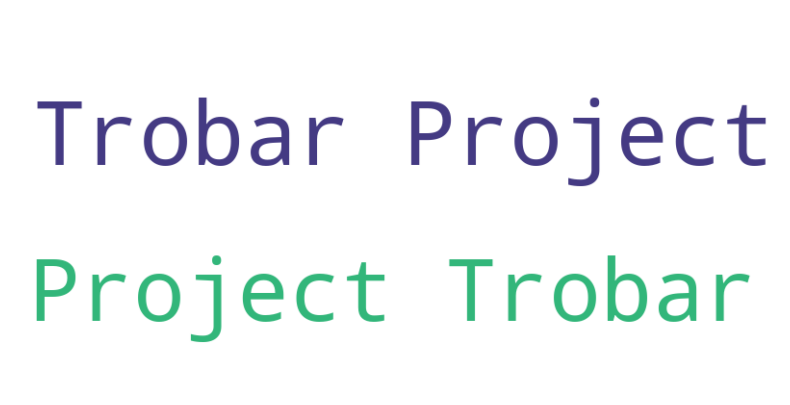

Vernissage Révéler l’impact – vernissage l’exposition Développement d’artistes Développement d’artistes Direction artistique & Événementiel Direction artistique & Événementiel Direction artistique & Événementiel Direction artistique & Événementiel Direction artistique & Événementiel Direction artistique & Événementiel Direction artistique & Événementiel Mémoires d’éléphant – Création, Arenberg Creative Mine (Wallers) Mémoires d’éléphant – Création, Arenberg Creative Mine (Wallers) Mémoires d’éléphant – Création, Arenberg Creative Mine (Wallers) Mémoires d’éléphant – phénix, Valenciennes
topic :  ['22_artistique_direction_vnementiel_dveloppement']


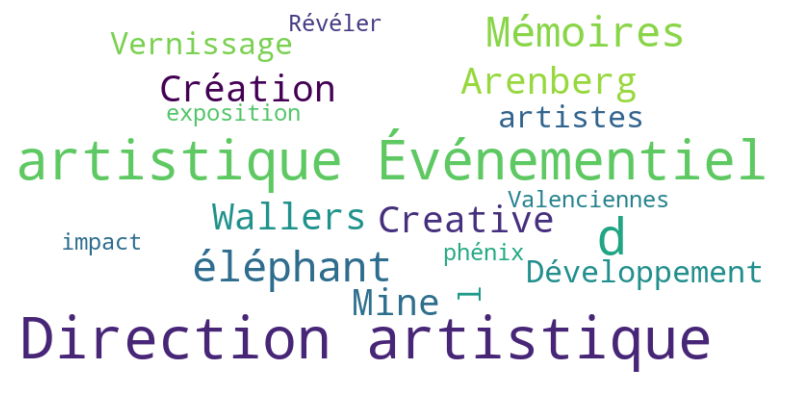

In [137]:
## make a world cloud for each topic
# Créer le Word Cloud

topics = df_activities['topic_2'].unique()
for topic in topics:
    text_data = " ".join(df_activities[df_activities['topic_2']==topic]['name'])
    text_data = " ".join([mots for mots in text_data.split() if mots.lower() not in stop_words])
    print(text_data)
    wordcloud = WordCloud(width=800, height=400, background_color='white', colormap='viridis').generate(text_data)
    print('topic : ', df_activities[df_activities['topic_2']==topic]['label_2'].unique() )
    # Afficher le Word Cloud
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis("off")  # Cacher les axes
    plt.show()

## Making a dataset for the analysis of the consumer behavior :

Make a data set with the nb of activities, the segmentation of the consumer (either child, young, adult, senior), the number of facebook, instagram followers and reported participants to activities.

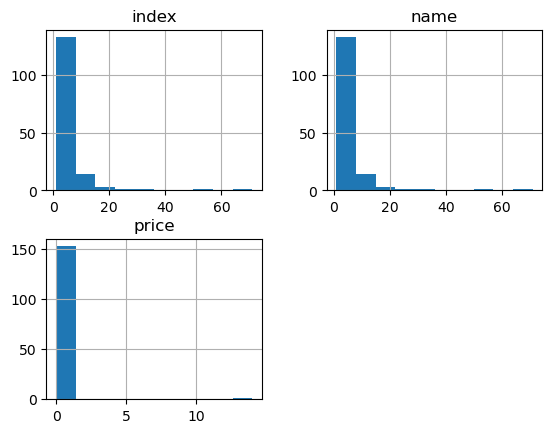

In [75]:
df_consumer_behavior = pd.DataFrame(columns = ['id','text_name','facebook_follower','facebook_likes', 'instagram_followers', 'instagram_publication', \
                                              'status'])

df_activities = pickle.load(open(folder_name+'df_activities.p','rb'))

df_activities.dropna( subset=['name'],inplace=True)
df_activities.groupby('id').count().hist() ## i chose not to remove duplicates because they are related to different activities


df_consumer_behavior[['id','text_name','facebook_follower','facebook_likes', 'instagram_followers', 'instagram_publication', \
                                              'status']] = df_information[['id','text_name','facebook_follower','facebook_likes', 'instagram_followers', 'instagram_publication', \
                                              'status']]

df_consumer_behavior = df_consumer_behavior.merge(df_activities.groupby('id').count()['name'], on='id', how='left').rename(columns={'name':'count_activities'})

pickle.dump(df_consumer_behavior,open('df_consumer_behavior.p','wb'))


In [76]:
df_information[df_information['id']==147]

,index,id,file_name,name,status,localisation,description,url,website_type,association_name,text_name,facebook_follower,facebook_likes,instagram_followers,instagram_publication,email
147,147,147,Vérone_productions,Vérone productions,,Lille,,http://www.veroneproductions.com,Site personnel,Verone Productions,Vérone_productions,13000.0,12000.0,NaN,NaN,contact@veroneproductions.com


In [77]:
df_consumer_behavior

,id,text_name,facebook_follower,facebook_likes,instagram_followers,instagram_publication,status,count_activities
0,0,Les_Éphémères,NaN,NaN,NaN,NaN,Association,2.0
1,1,NaN,NaN,NaN,NaN,NaN,Association,1.0
2,2,Le_Bureau_des_Spectacles,NaN,NaN,NaN,NaN,SAS,NaN
3,3,Billy_Society_Production,95.0,76.0,NaN,NaN,,4.0
4,4,Ginger_Kick_Events,NaN,NaN,NaN,NaN,Association,1.0
...,...,...,...,...,...,...,...,...
164,164,Rock_Aisne_festival,NaN,NaN,NaN,NaN,Association,NaN
165,165,Reivax_Tour,NaN,NaN,NaN,NaN,Association,3.0
166,166,Saint-Omer_Jaaz_festival,5000.0,8000.0,3000.0,200.0,EPCC,4.0
167,167,Rock_en_Stock,NaN,NaN,NaN,NaN,Association,9.0


In [78]:
df_information.columns

Index(['index', 'id', 'file_name', 'name', 'status', 'localisation',
       'description', 'url', 'website_type', 'association_name', 'text_name',
       'facebook_follower', 'facebook_likes', 'instagram_followers',
       'instagram_publication', 'email'],
      dtype='object')

## Tranform module : 

In [8]:
import sys
import importlib
sys.path.append('../source')
import transform
importlib.reload(transform)
from transform import SplitComplexColumns, TopicExtractor

import pickle

In [9]:
df = pickle.load(open('df_final.p','rb'))
df.reset_index(inplace=True)
df['id'] = df.index
list_columns = ['id' ]+ list(df.columns[:-1])
df = df[list_columns].reset_index()

splitter = SplitComplexColumns( id_column = 'id', list_dic_col_split_str =[{'col': 'functions', 'sep':','}])
df_simple,complex_dfs =  splitter.transform( df)

In [12]:
complex_dfs['offers'].dtypes

id                int64
description      object
name             object
price           float64
target_group     object
dtype: object

In [248]:
df_objectives = complex_dfs['objectives']

In [283]:
import sys
import importlib
sys.path.append('../source')
import transform
importlib.reload(transform)
from transform import SplitComplexColumns, TopicExtractor, Transform

import pickle

In [254]:
topic_extractor = TopicExtractor()
df_temp = topic_extractor.extract_topic(df_objectives)
print(df_temp)

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\axelp\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


      id  ...                                Representative_Docs
0      0  ...  [promouvoir culture l'accordéon, promouvoir cu...
1      0  ...  [organisation soirées concerts, organisation c...
2      0  ...  [économiser l'énergie grâce système création d...
3      2  ...  [proposer spectacles jeune public, spectacles,...
4      2  ...  [proposer spectacles jeune public, spectacles,...
..   ...  ...                                                ...
596  168  ...  [organize an annual exceptional and free conce...
597  168  ...  [organiser événements musicaux, organiser évén...
598  168  ...  [promouvoir culture l'accordéon, promouvoir cu...
599  168  ...  [promouvoir musique artistes, promouvoir musiq...
600  168  ...  [promouvoir culture l'accordéon, promouvoir cu...

[601 rows x 7 columns]


In [284]:
df_offers = complex_dfs['offers']
topic_extractor = TopicExtractor()
df_temp = topic_extractor.extract_topics(df_offers)

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\axelp\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


score 0.7727272727272727
score 0.7727272727272727
score 0.8888888888888888
score 0.5909090909090909


In [260]:
df_offers = complex_dfs['offers']

In [49]:
import sys
import importlib
sys.path.append('../source')
import transform
importlib.reload(transform)
from transform import SplitComplexColumns, TopicExtractor, Transform
import pickle

In [50]:
a = ['ok','ab',1]
any([(type(item)==str) for item in a ])

True

In [51]:
df = pickle.load(open('df_final.p','rb'))
transform_ = Transform( list_dic_col_split_str =[{'col': 'functions', 'sep':','}])
df_simple, complex_dfs = transform_.transform(df)

score 0.35294117647058826


[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\axelp\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


AttributeError: 'str' object has no attribute 'contains'

In [45]:
complex_dfs['offers']['description_topic_label'].drop_duplicates()

0          0_culturelles_jazz_entre_musicales
1419      1_spectacles_spectacle_rue_palettes
4796               4_ch4_tshirts_tshirt_metal
4797         3_composer_voices_musique_chants
156165     2_spectacle_cherche_village_troupe
Name: description_topic_label, dtype: object

In [43]:
complex_dfs['offers']

,id,description,description_topic,Count,description_topic_label,description_topic_representation,description_Representative_Docs,name,price,target_group
0,2,Spectacles et concerts des principaux artistes...,0,139,0_culturelles_jazz_entre_musicales,"[culturelles, jazz, entre, musicales, musicale...","[lieu affiche vitalité, privilégiant initiativ...",Spectacles et concerts,NaN,Tout public
1,3,Concert featuring Dimimagery and Nakedsoftmen....,0,139,0_culturelles_jazz_entre_musicales,"[culturelles, jazz, entre, musicales, musicale...","[lieu affiche vitalité, privilégiant initiativ...",Dimimagery and Nakedsoftmen.band Concert,NaN,Music lovers
2,3,Concert featuring Dimimagery and Nakedsoftmen....,0,139,0_culturelles_jazz_entre_musicales,"[culturelles, jazz, entre, musicales, musicale...","[lieu affiche vitalité, privilégiant initiativ...",Dimimagery and Nakedsoftmen.band Concert,NaN,Music lovers
3,3,Concert featuring Dimimagery and Nakedsoftmen....,0,139,0_culturelles_jazz_entre_musicales,"[culturelles, jazz, entre, musicales, musicale...","[lieu affiche vitalité, privilégiant initiativ...",Dimimagery and Nakedsoftmen.band Concert,NaN,Music lovers
4,3,Concert featuring Dimimagery and Nakedsoftmen....,0,139,0_culturelles_jazz_entre_musicales,"[culturelles, jazz, entre, musicales, musicale...","[lieu affiche vitalité, privilégiant initiativ...",Dimimagery and Nakedsoftmen.band Concert,NaN,Music lovers
...,...,...,...,...,...,...,...,...,...,...
22484405,168,Animations musicales diverses,0,139,0_culturelles_jazz_entre_musicales,"[culturelles, jazz, entre, musicales, musicale...","[lieu affiche vitalité, privilégiant initiativ...",Animations,NaN,Tout public
22484406,168,Animations musicales diverses,0,139,0_culturelles_jazz_entre_musicales,"[culturelles, jazz, entre, musicales, musicale...","[lieu affiche vitalité, privilégiant initiativ...",Animations,NaN,Tout public
22484407,168,Animations musicales diverses,0,139,0_culturelles_jazz_entre_musicales,"[culturelles, jazz, entre, musicales, musicale...","[lieu affiche vitalité, privilégiant initiativ...",Animations,NaN,Tout public
22484408,168,Animations musicales diverses,0,139,0_culturelles_jazz_entre_musicales,"[culturelles, jazz, entre, musicales, musicale...","[lieu affiche vitalité, privilégiant initiativ...",Animations,NaN,Tout public


##